In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
!ls /content/drive/My\Drive\/Grupo4SDR/

11b11M_2024-07-01T20_26_14_320.wav  11g6M_2024-07-01T20_26_38_522.wav
11b1M_2024-07-01T20_25_24_297.wav   11g9M_2024-07-01T20_26_59_997.wav
11b2M_2024-07-01T20_25_40_872.wav   11nMsc2_2024-07-01T20_31_16_339.wav
11g12M_2024-07-01T20_28_25_061.wav  11nMsc3_2024-07-01T20_31_41_274.wav
11g18M_2024-07-01T20_28_43_566.wav  11nMsc4_2024-07-01T20_32_01_785.wav
11g24M_2024-07-01T20_29_04_581.wav  11nMsc5_2024-07-01T20_32_28_547.wav
11g36M_2024-07-01T20_29_24_492.wav  11nMsc6_2024-07-01T20_32_45_673.wav
11g48M_2024-07-01T20_29_46_553.wav  11nMsc7_2024-07-01T20_33_11_995.wav
11g54M_2024-07-01T20_30_09_988.wav  ruido_2024-07-01T20_33_43_320.wav


## Espectrogramas de señales 802.11b

<ipython-input-9-3283d9c0a01d>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


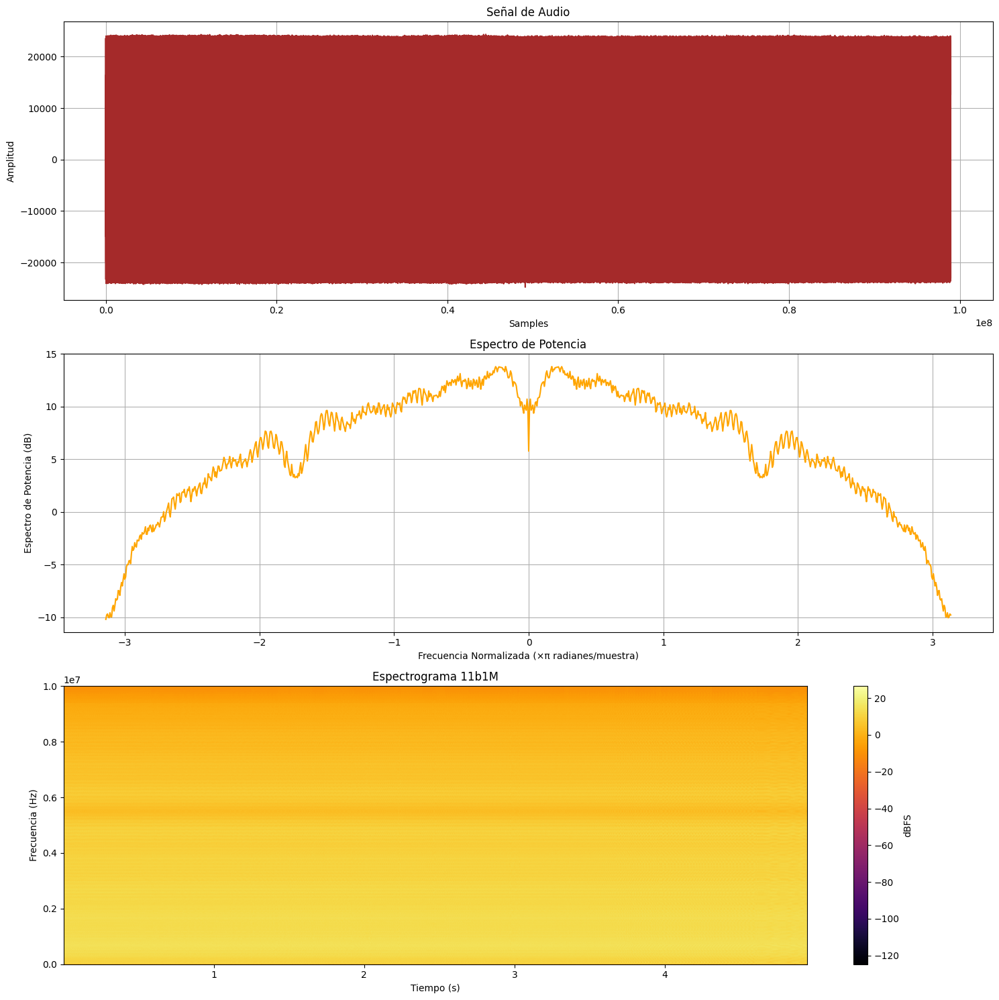

In [9]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11b1M_2024-07-01T20_25_24_297.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b1M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-10-2a5596ac0829>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


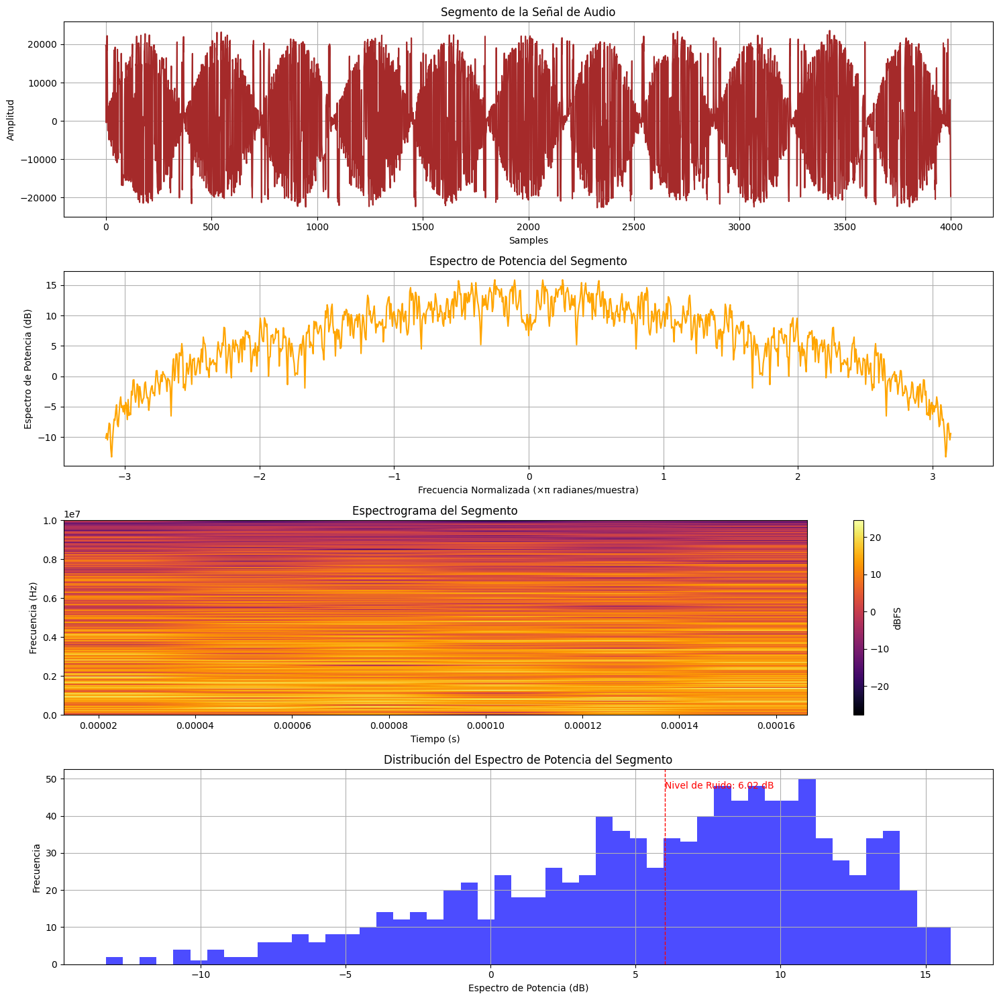

In [10]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11b1M_2024-07-01T20_25_24_297.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-11-01b979460ecc>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


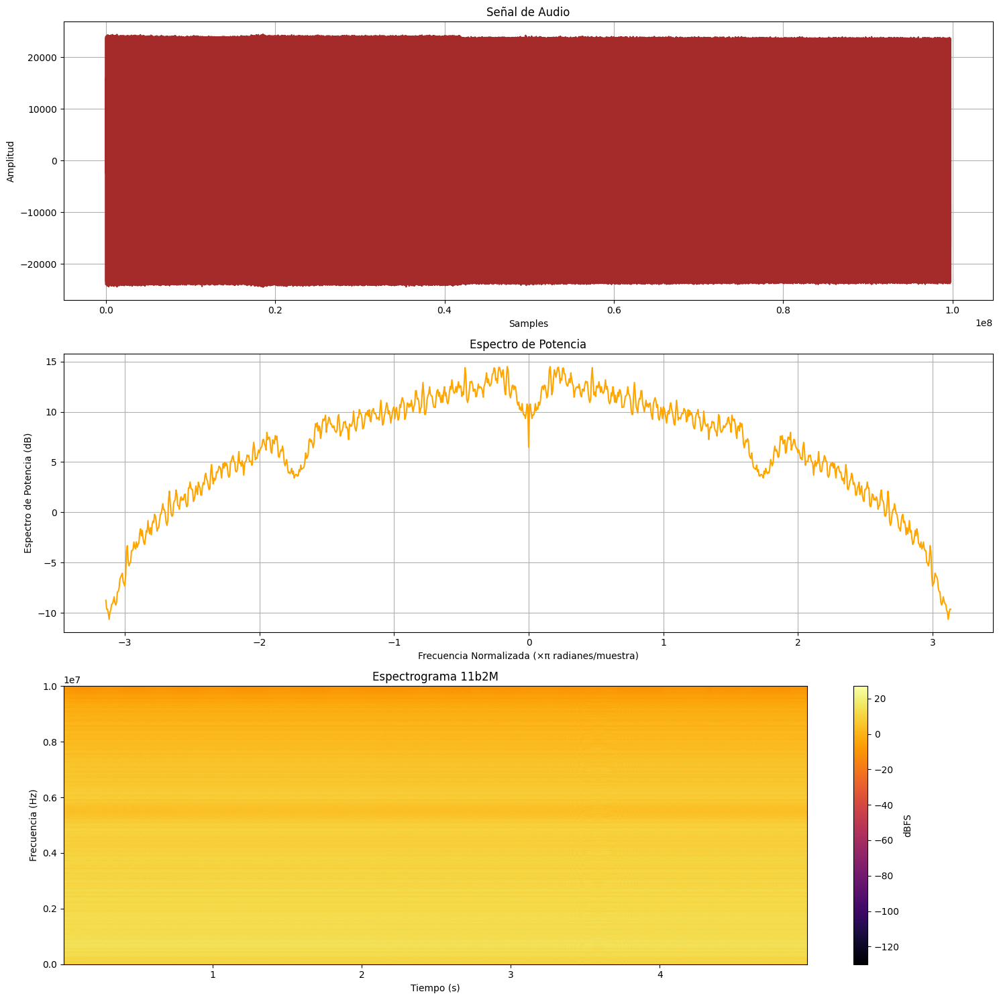

In [11]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11b2M_2024-07-01T20_25_40_872.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b2M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-12-d81a064c2249>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


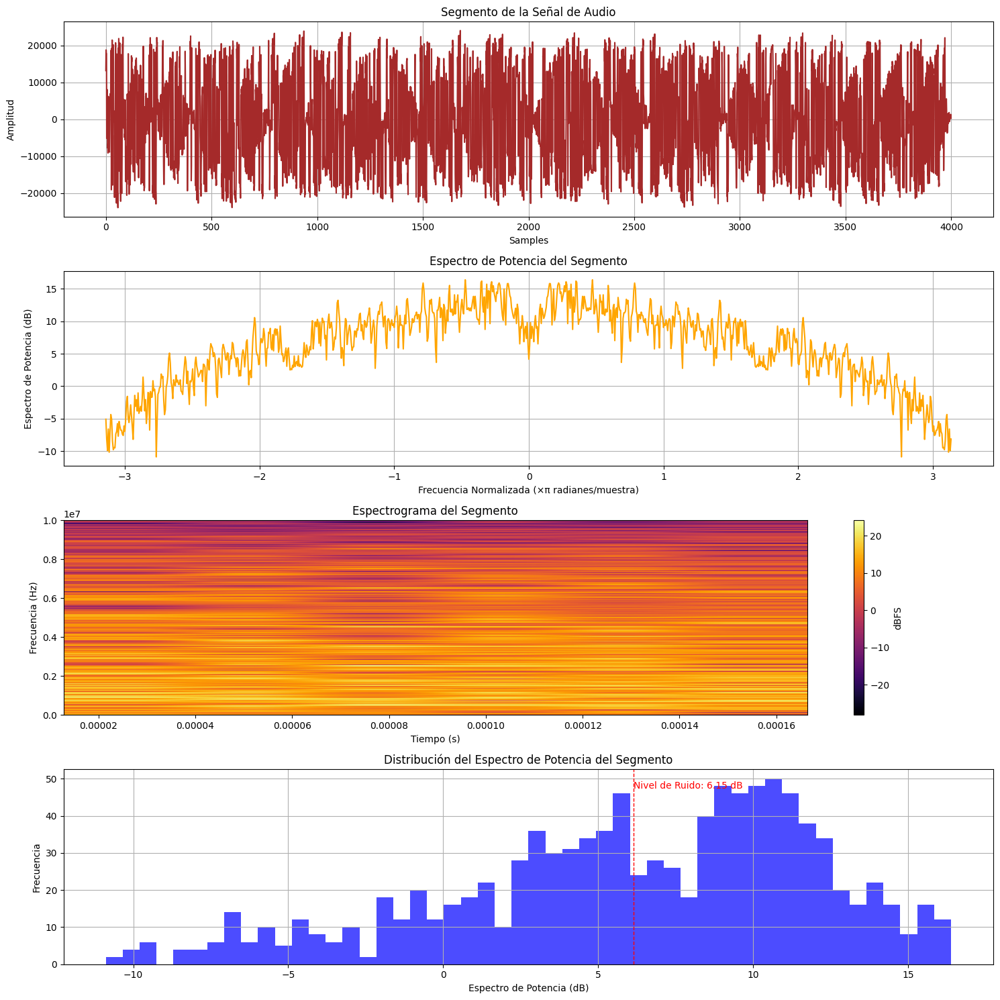

In [12]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11b2M_2024-07-01T20_25_40_872.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-13-7b63005e6c20>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


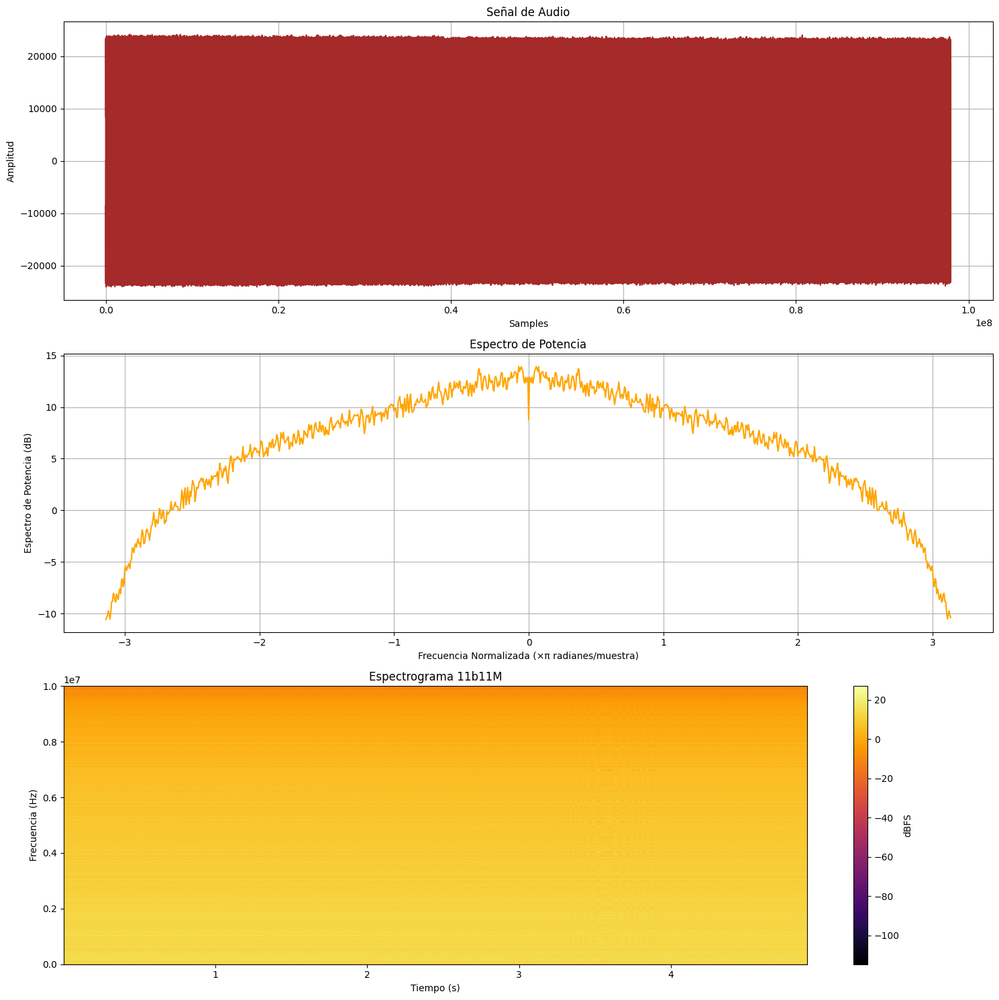

In [13]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11b11M_2024-07-01T20_26_14_320.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b11M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-14-8d7a7639f67b>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


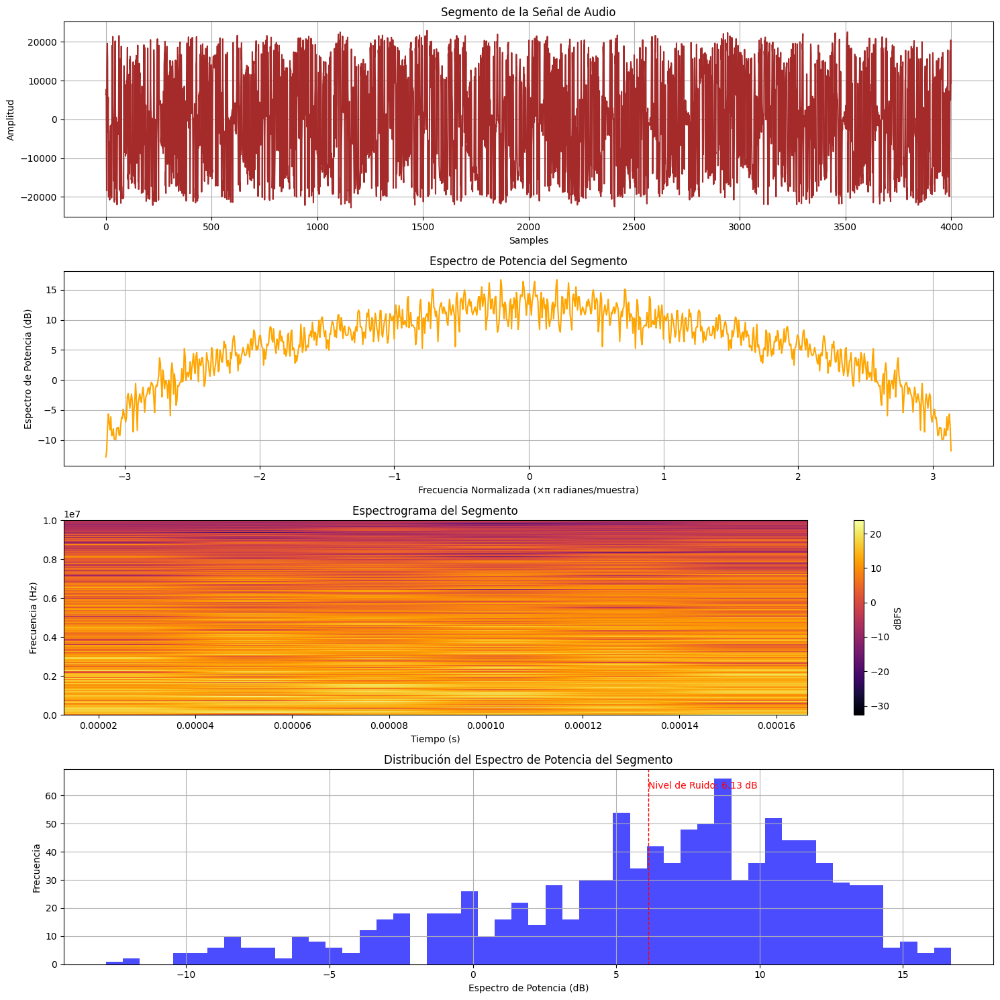

In [14]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11b11M_2024-07-01T20_26_14_320.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señal de ruido

<ipython-input-15-8361579243f0>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


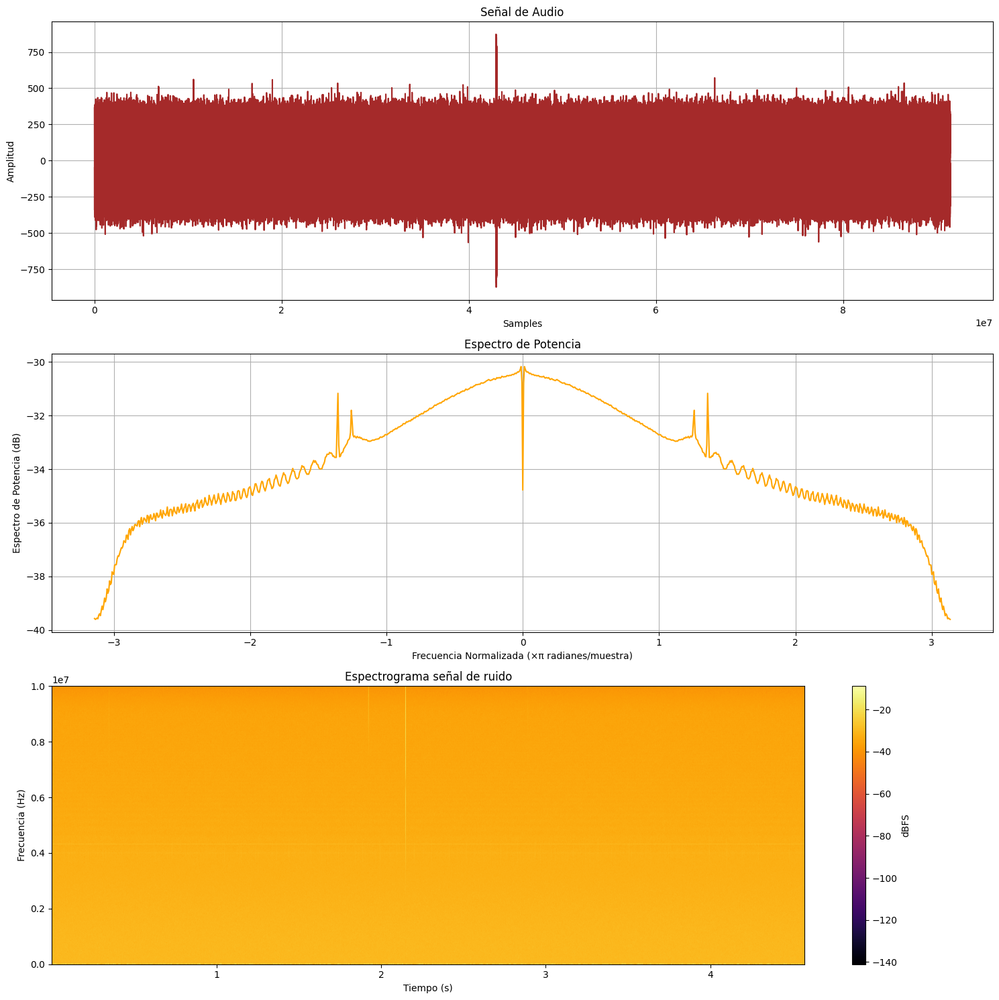

In [15]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/ruido_2024-07-01T20_33_43_320.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma señal de ruido')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-16-14d5069b58b0>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


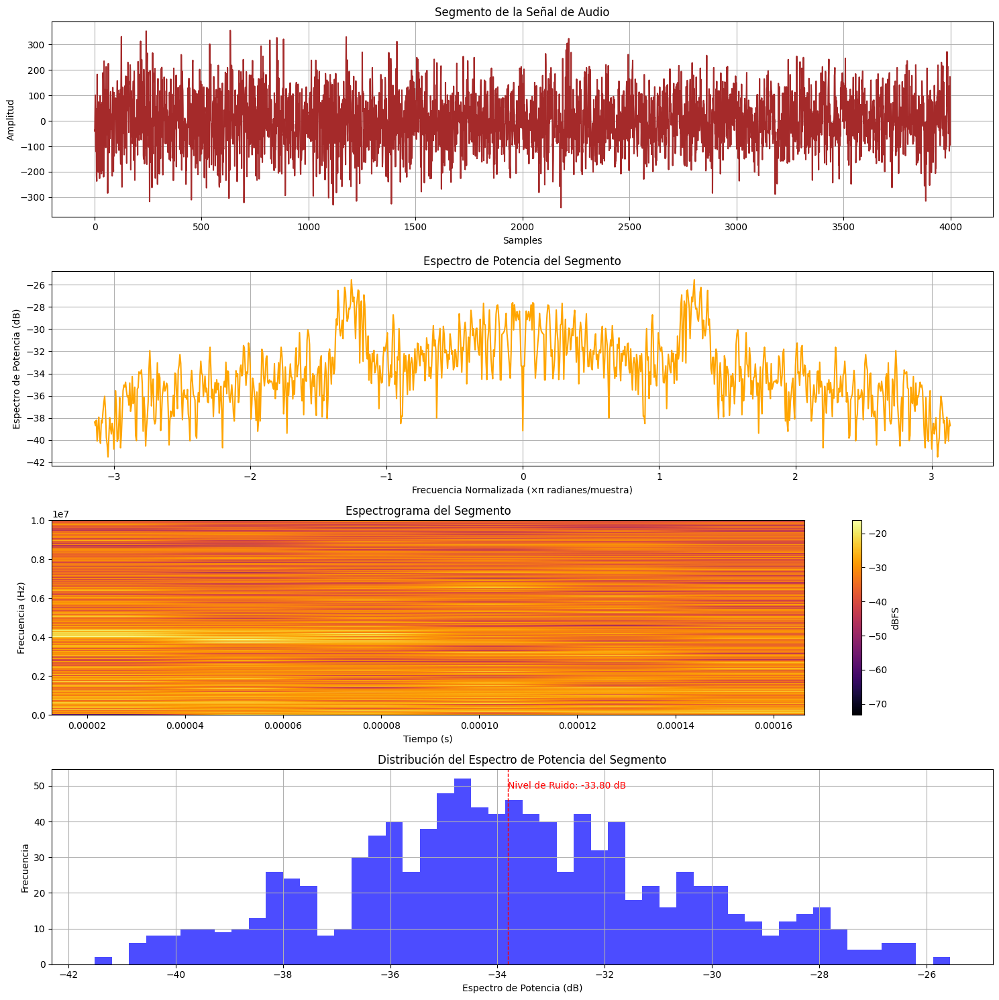

In [16]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/ruido_2024-07-01T20_33_43_320.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11n

<ipython-input-17-fd140124a7bb>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


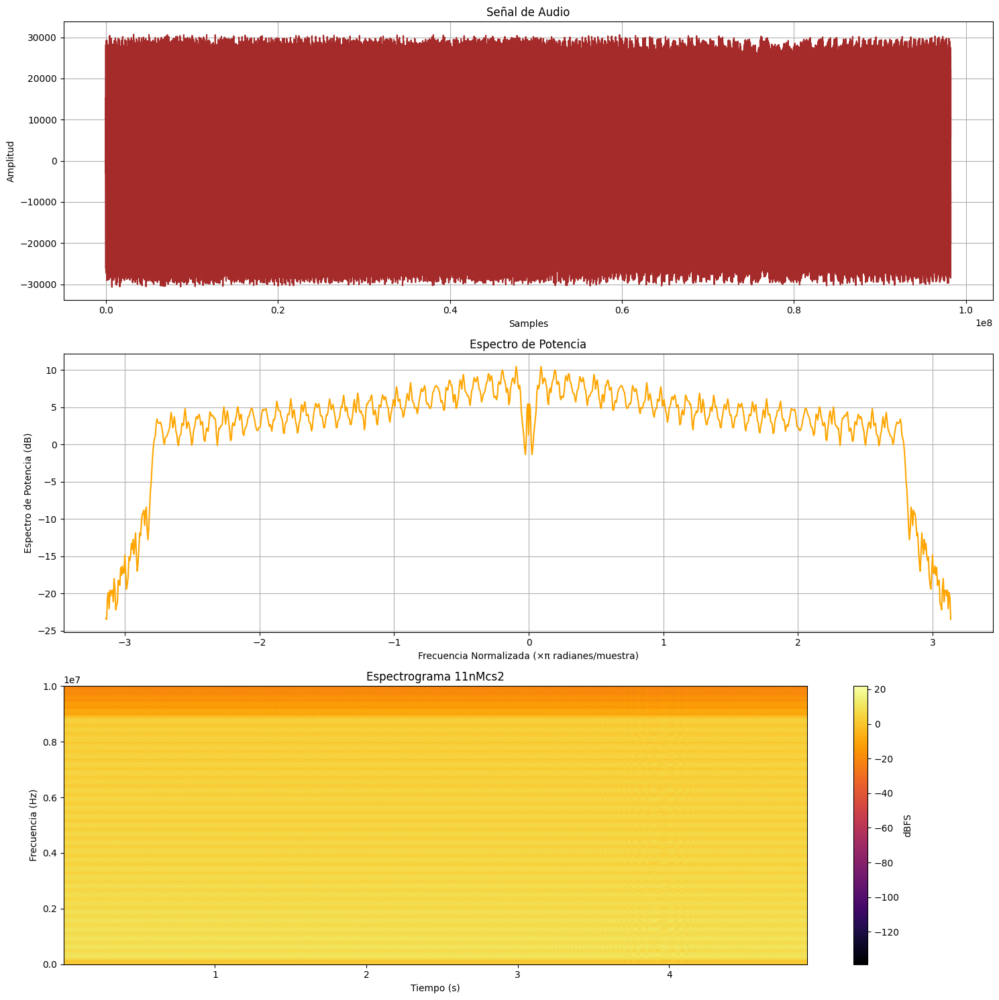

In [17]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc2_2024-07-01T20_31_16_339.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs2')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-18-2f35a5062833>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


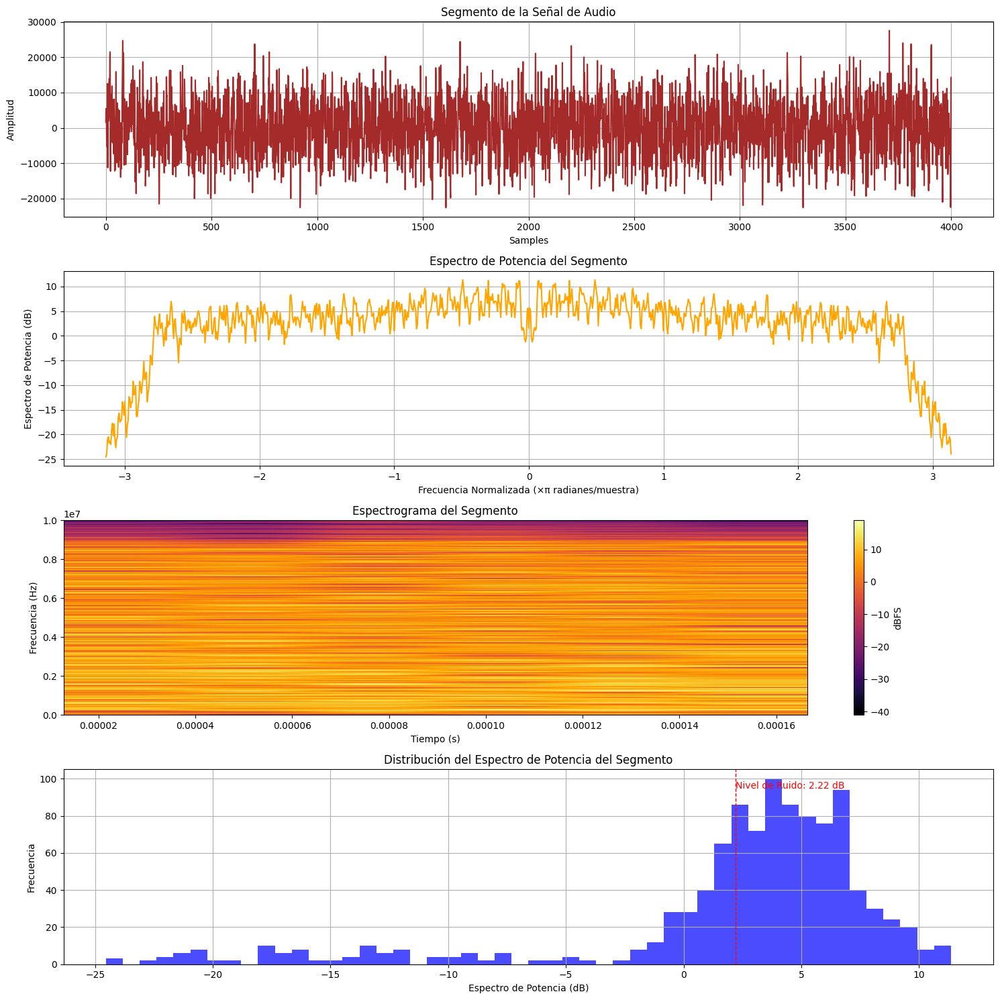

In [18]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc2_2024-07-01T20_31_16_339.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-19-791e06807026>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


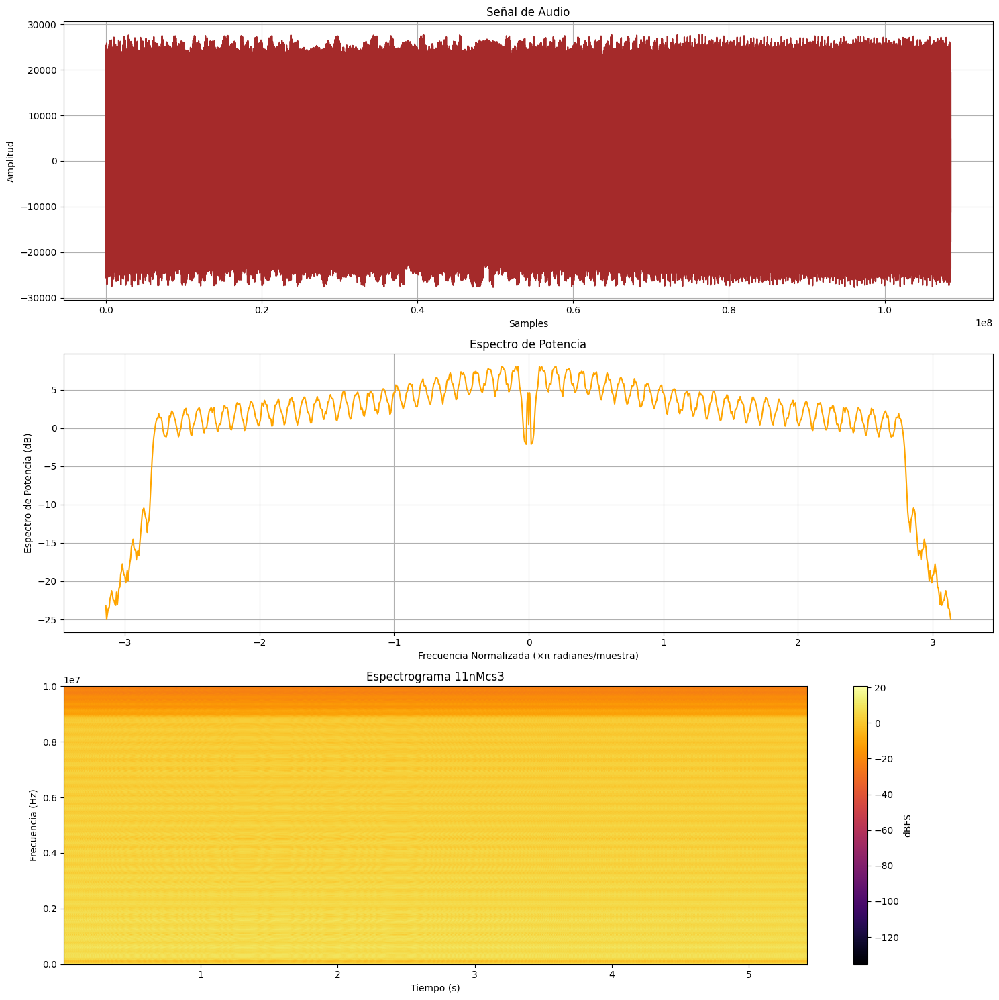

In [19]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc3_2024-07-01T20_31_41_274.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs3')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-20-443de239885c>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


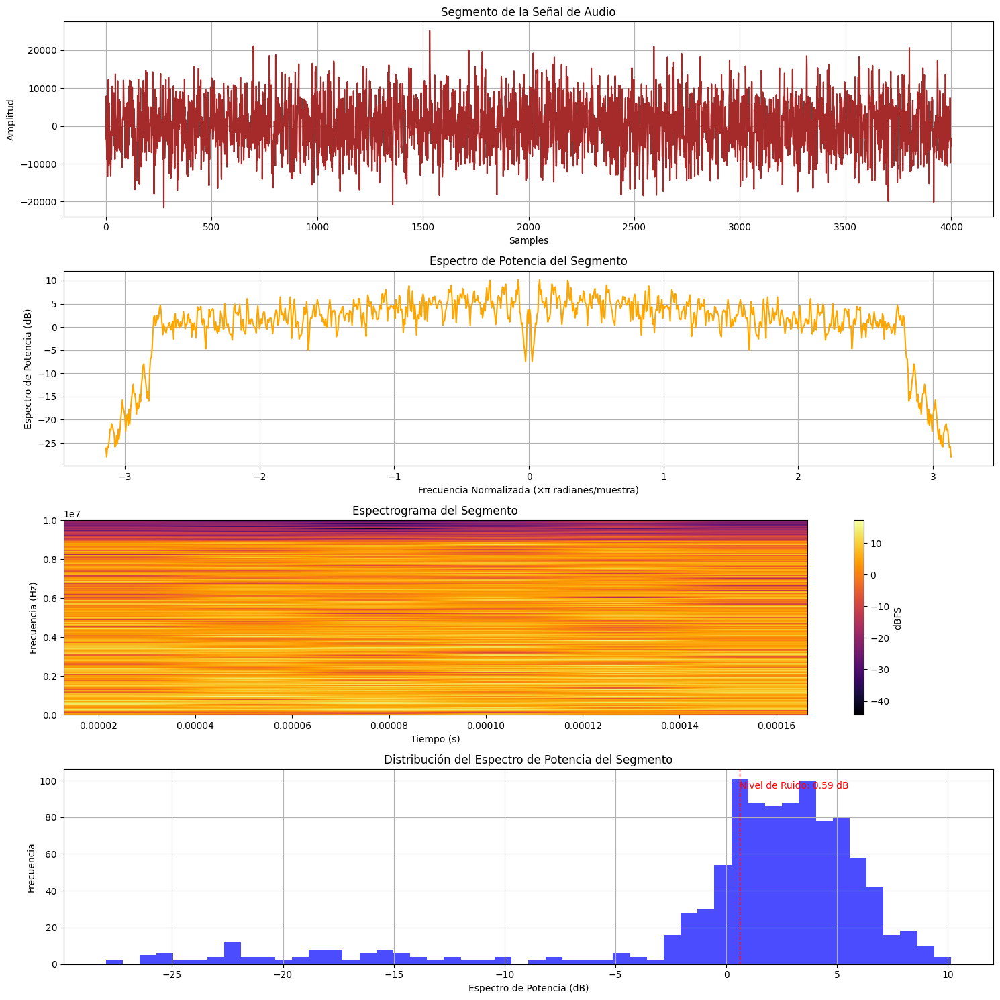

In [20]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc3_2024-07-01T20_31_41_274.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-21-b60822d495c0>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


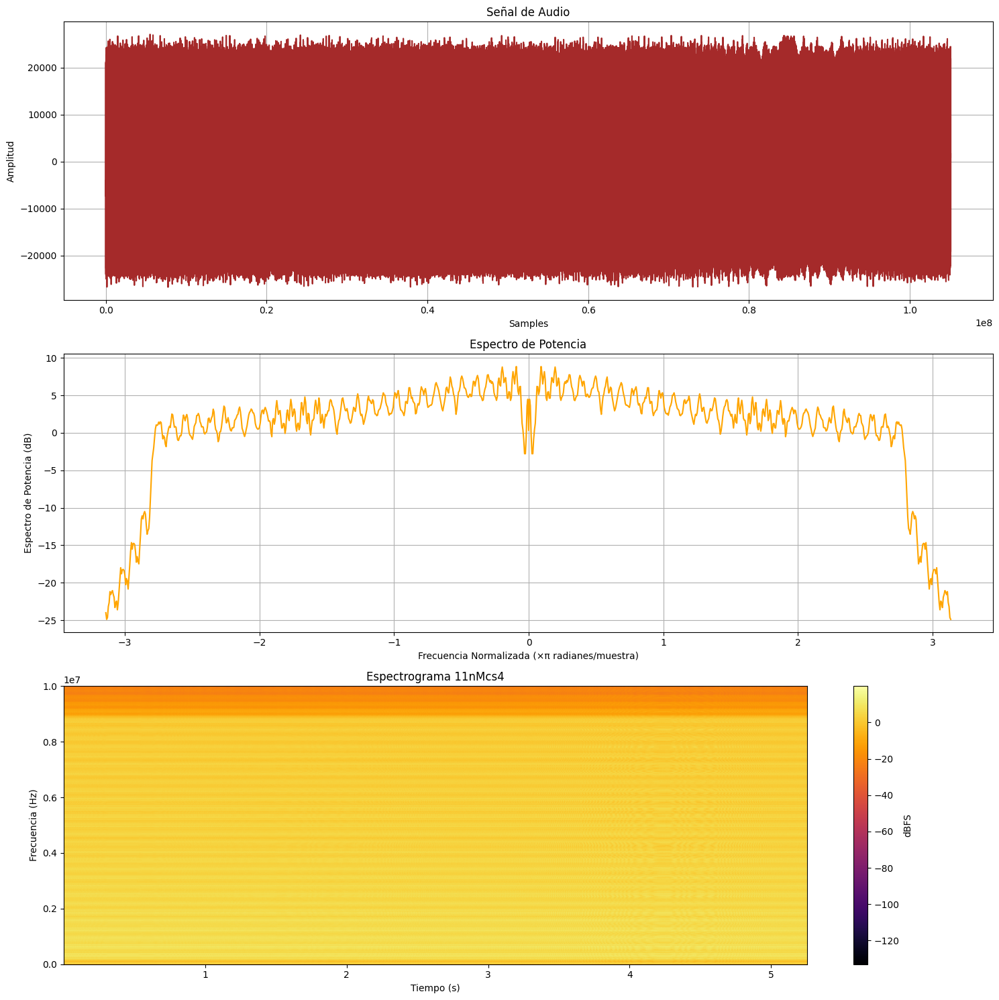

In [21]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc4_2024-07-01T20_32_01_785.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs4')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-22-a36cc2b5de71>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


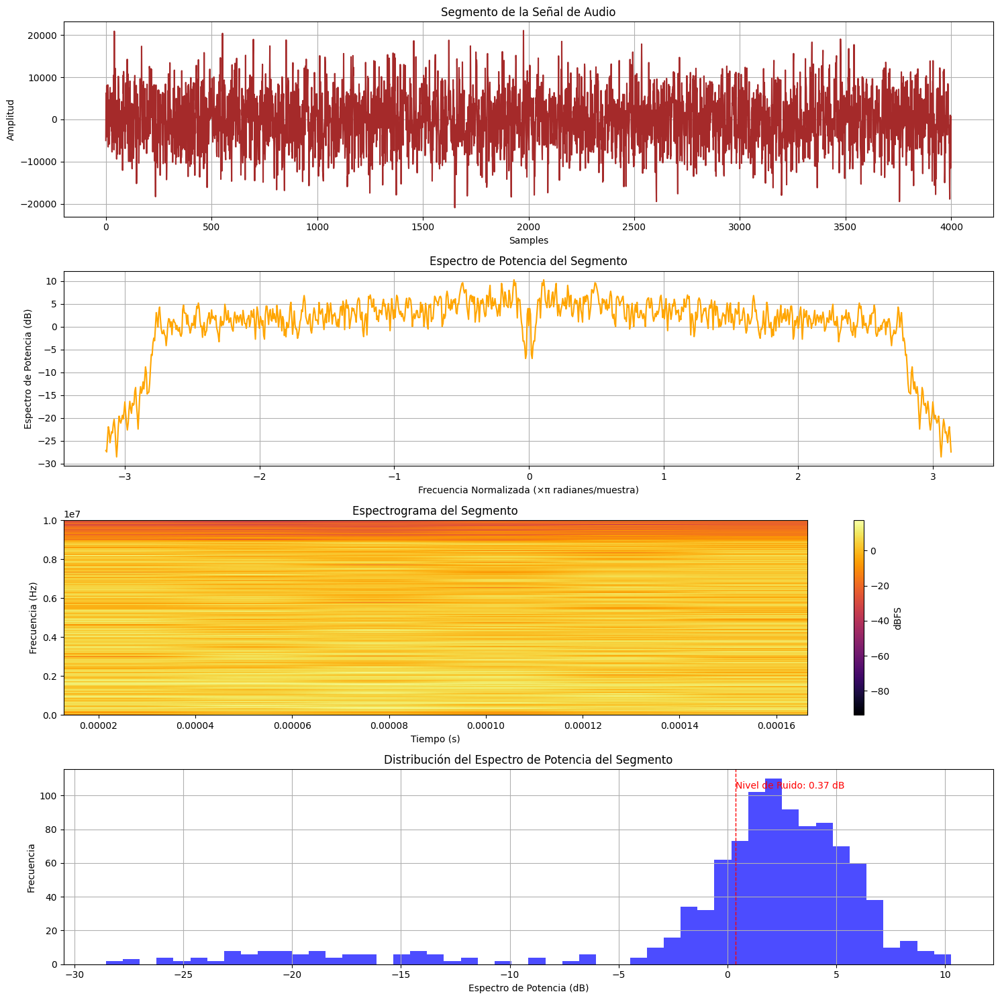

In [22]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc4_2024-07-01T20_32_01_785.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-23-327664b6539a>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


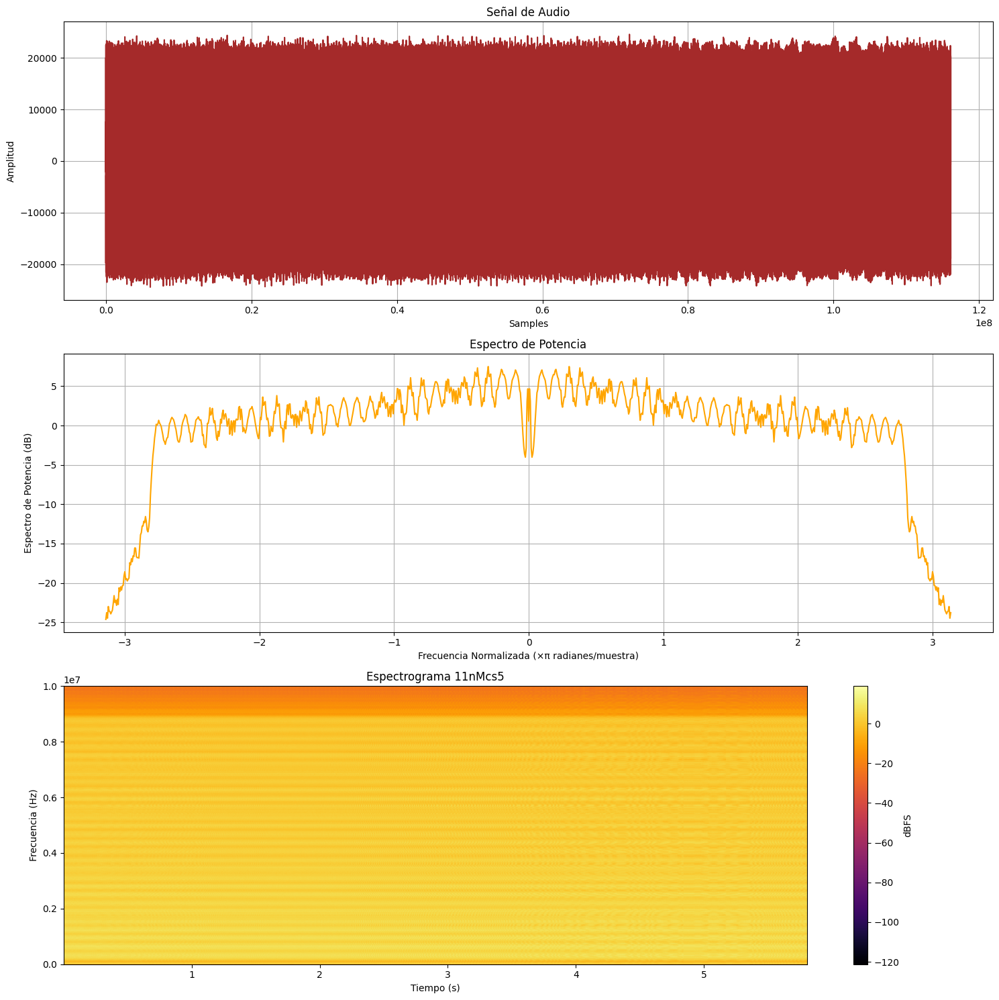

In [23]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc5_2024-07-01T20_32_28_547.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs5')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-24-7b1cc4fa7287>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


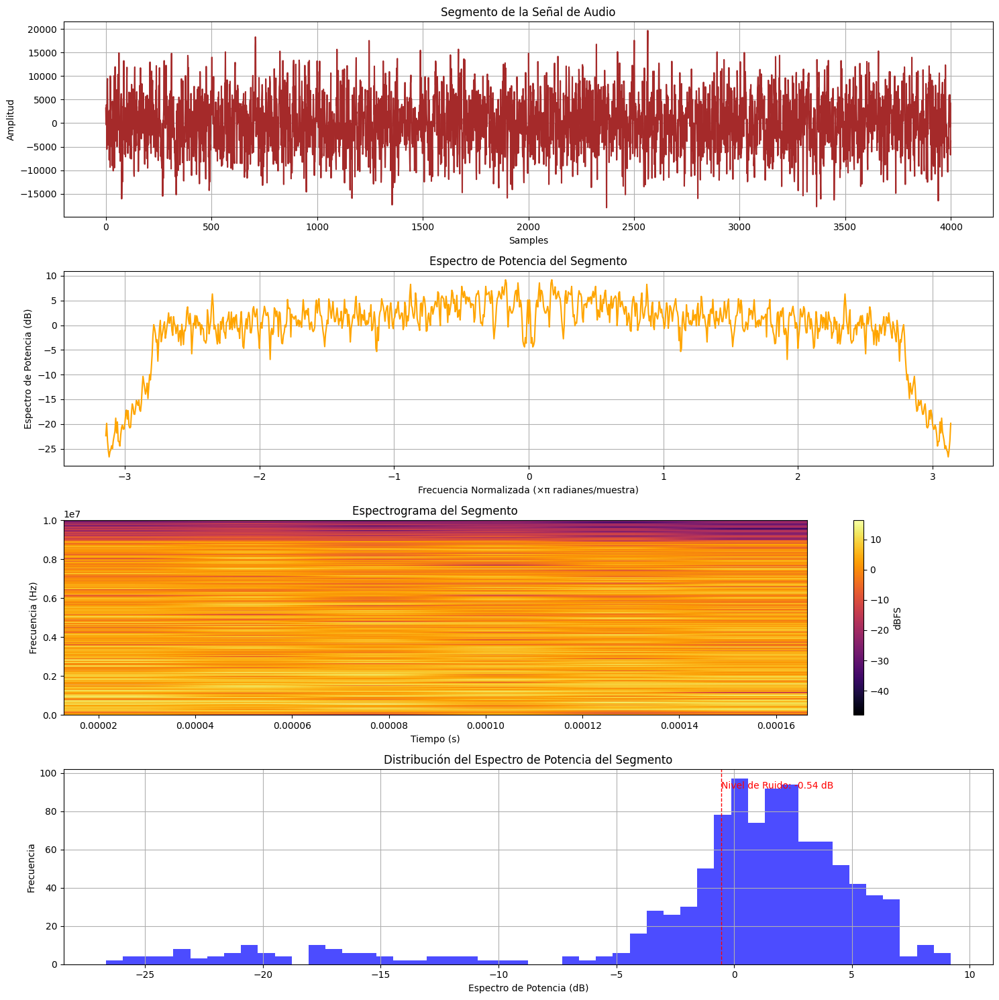

In [24]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc5_2024-07-01T20_32_28_547.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-25-307881ca1dbb>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


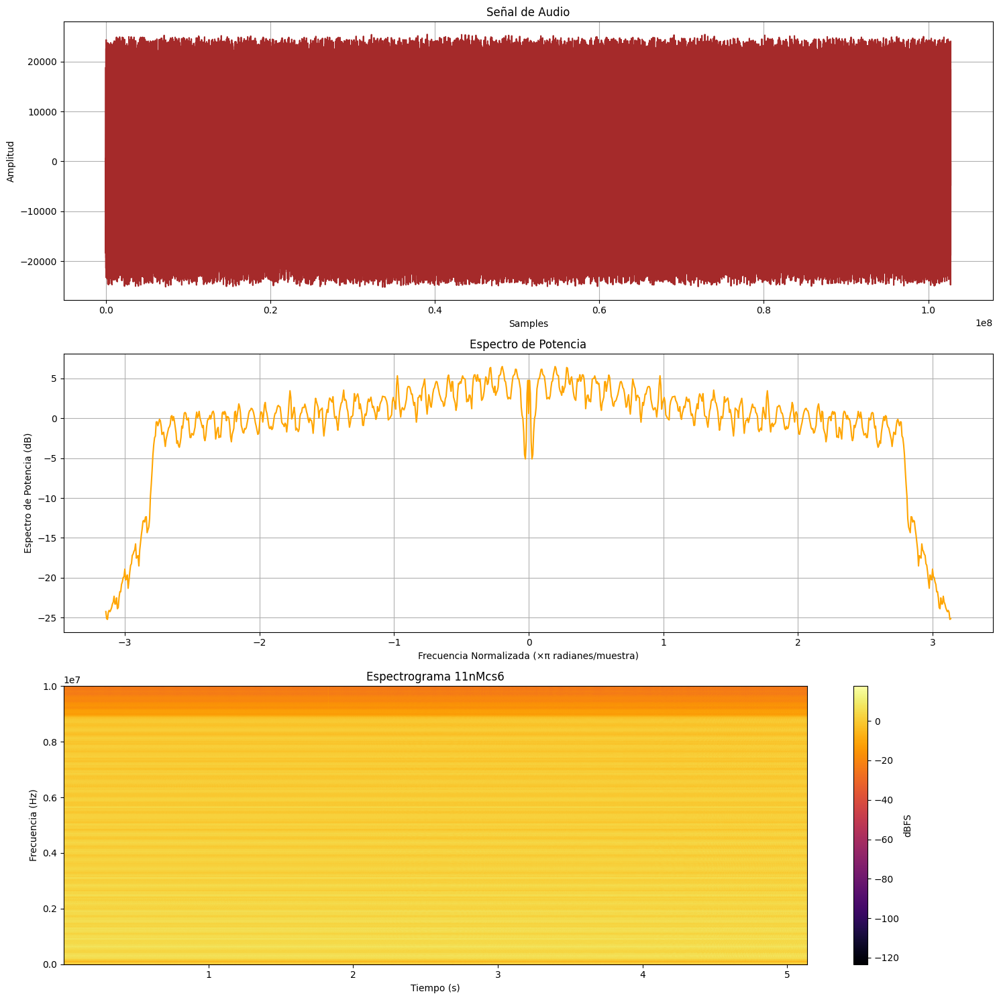

In [25]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc6_2024-07-01T20_32_45_673.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs6' )
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-26-8fcfccbecc32>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


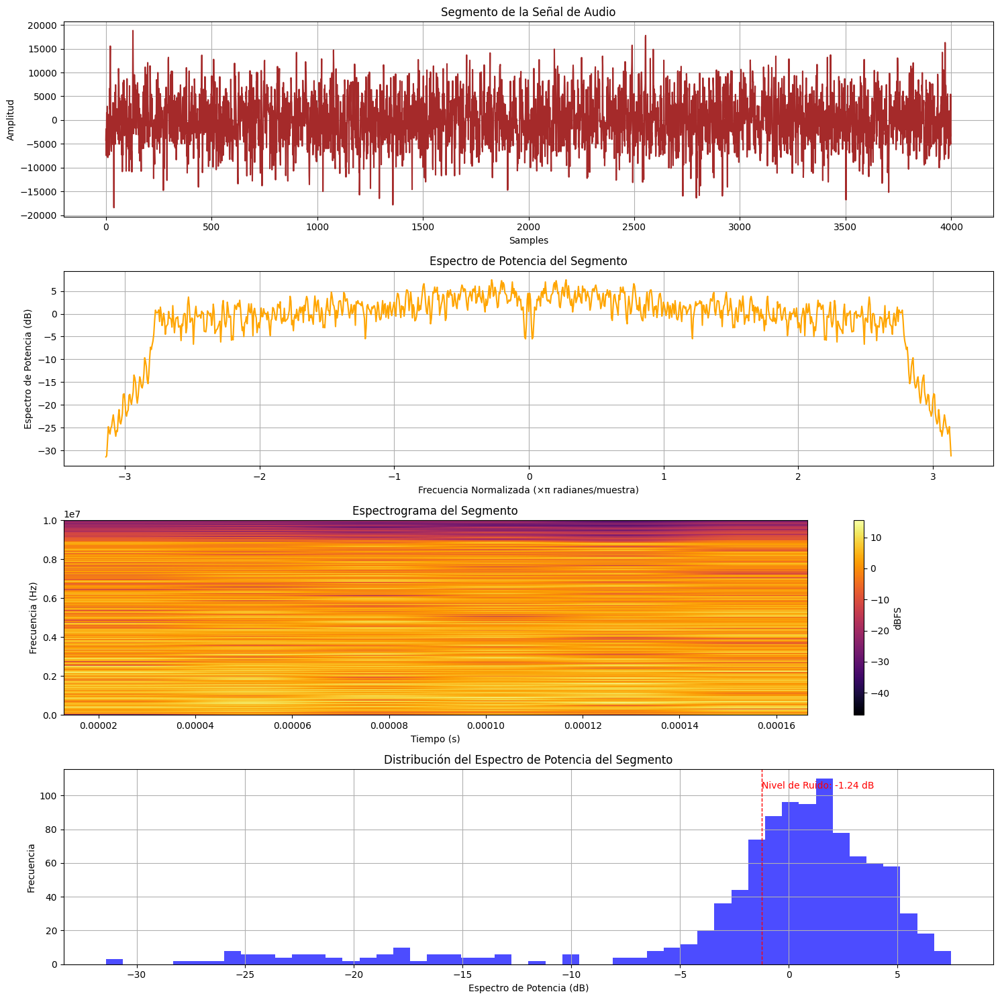

In [26]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc6_2024-07-01T20_32_45_673.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-27-5ae25d36717f>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


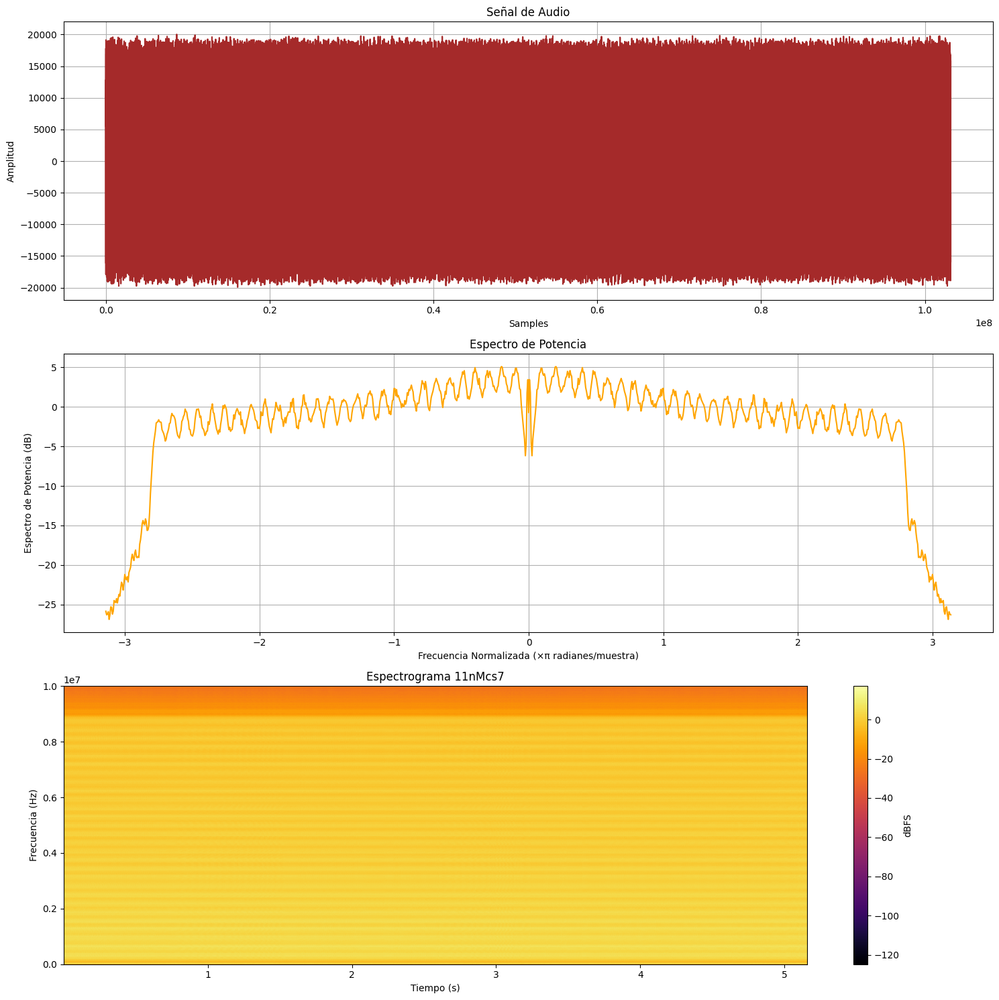

In [27]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc7_2024-07-01T20_33_11_995.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs7')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-28-db8b930ff548>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


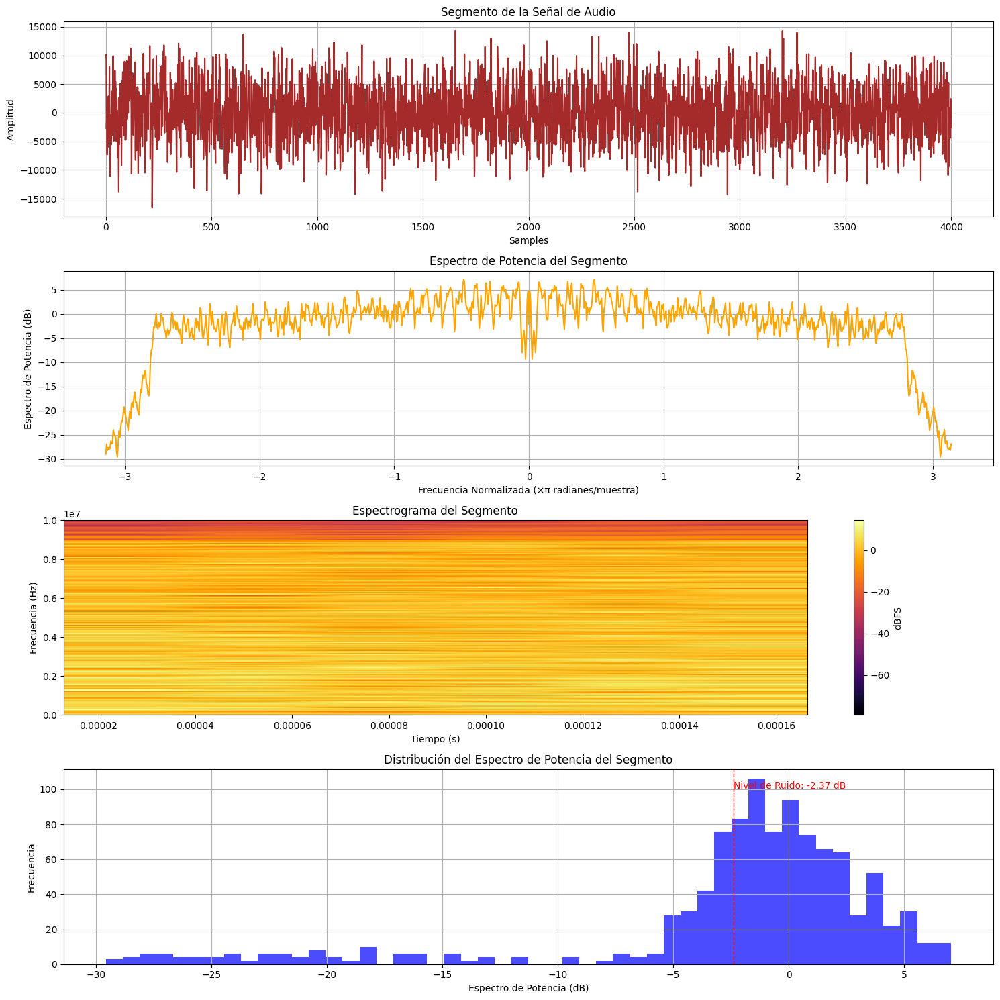

In [28]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11nMsc7_2024-07-01T20_33_11_995.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11g

<ipython-input-29-781c7bf95c31>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


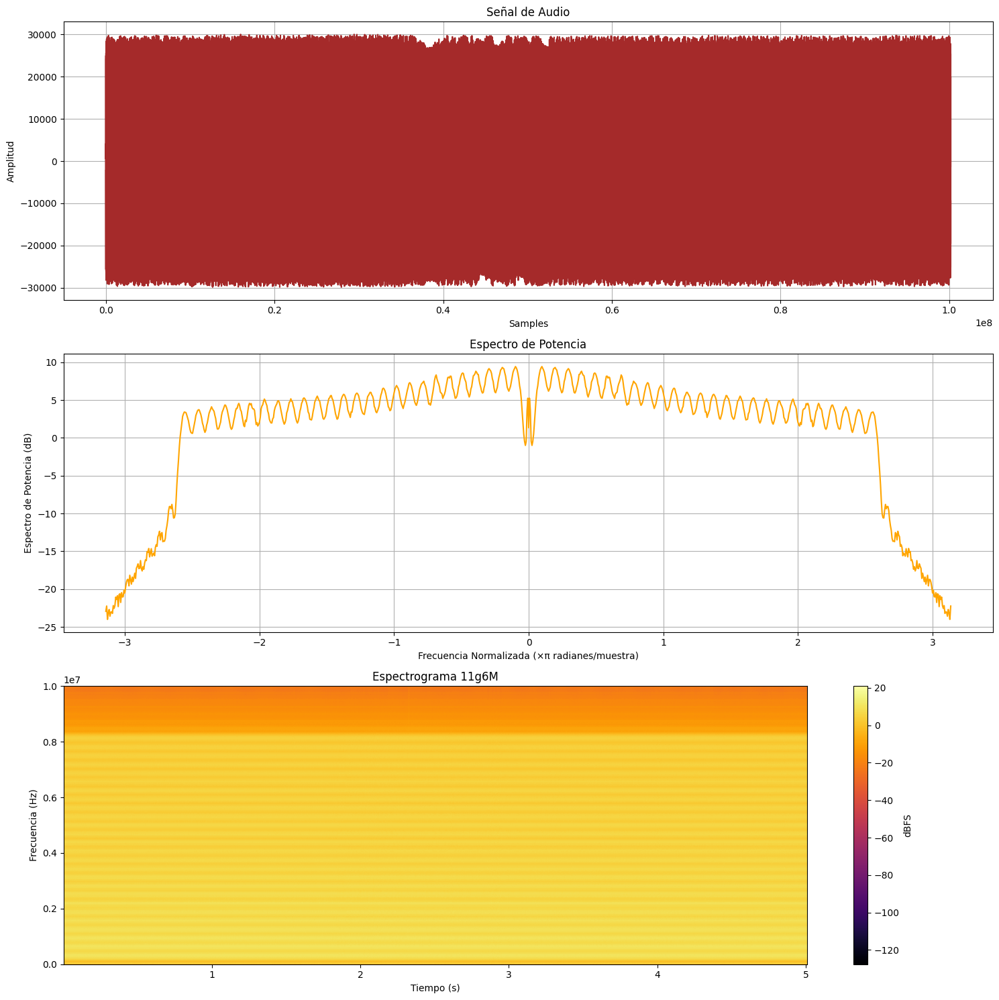

In [29]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g6M_2024-07-01T20_26_38_522.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g6M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-30-9a2fd09617c3>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


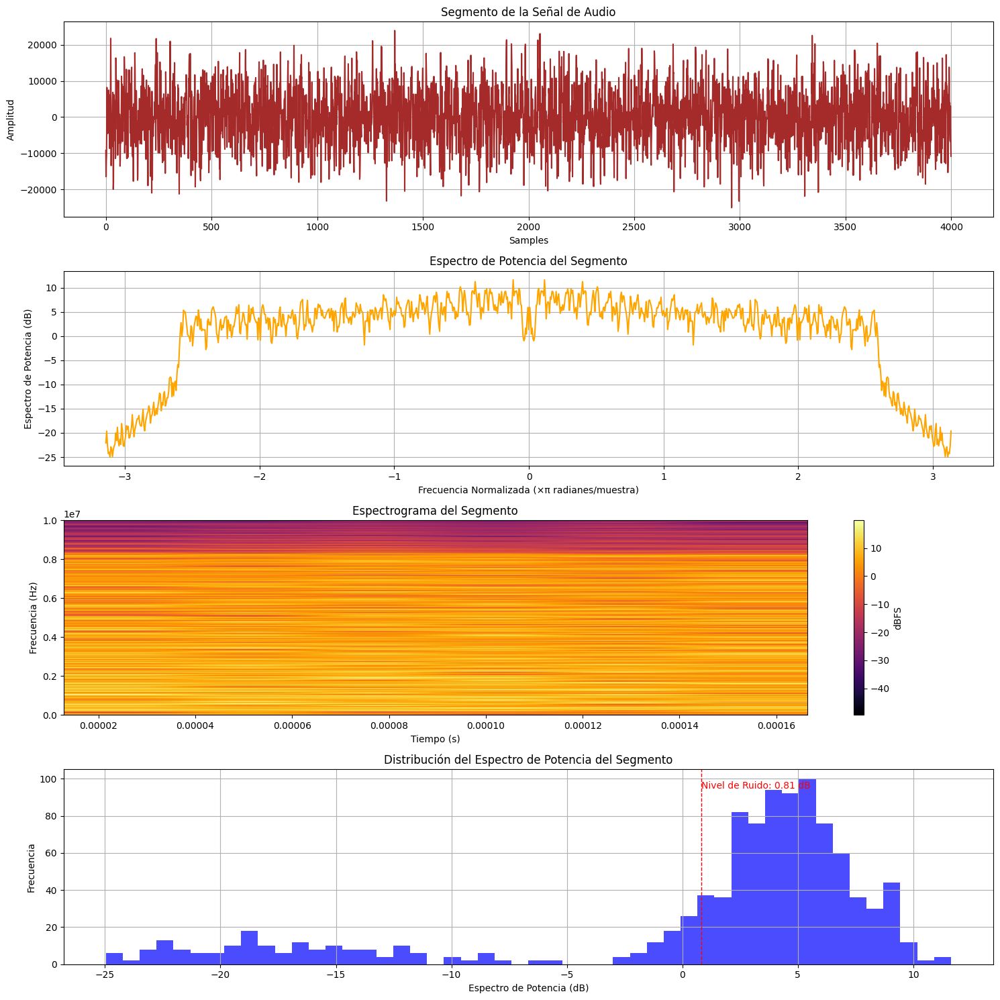

In [30]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g6M_2024-07-01T20_26_38_522.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-31-c35843d83da3>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


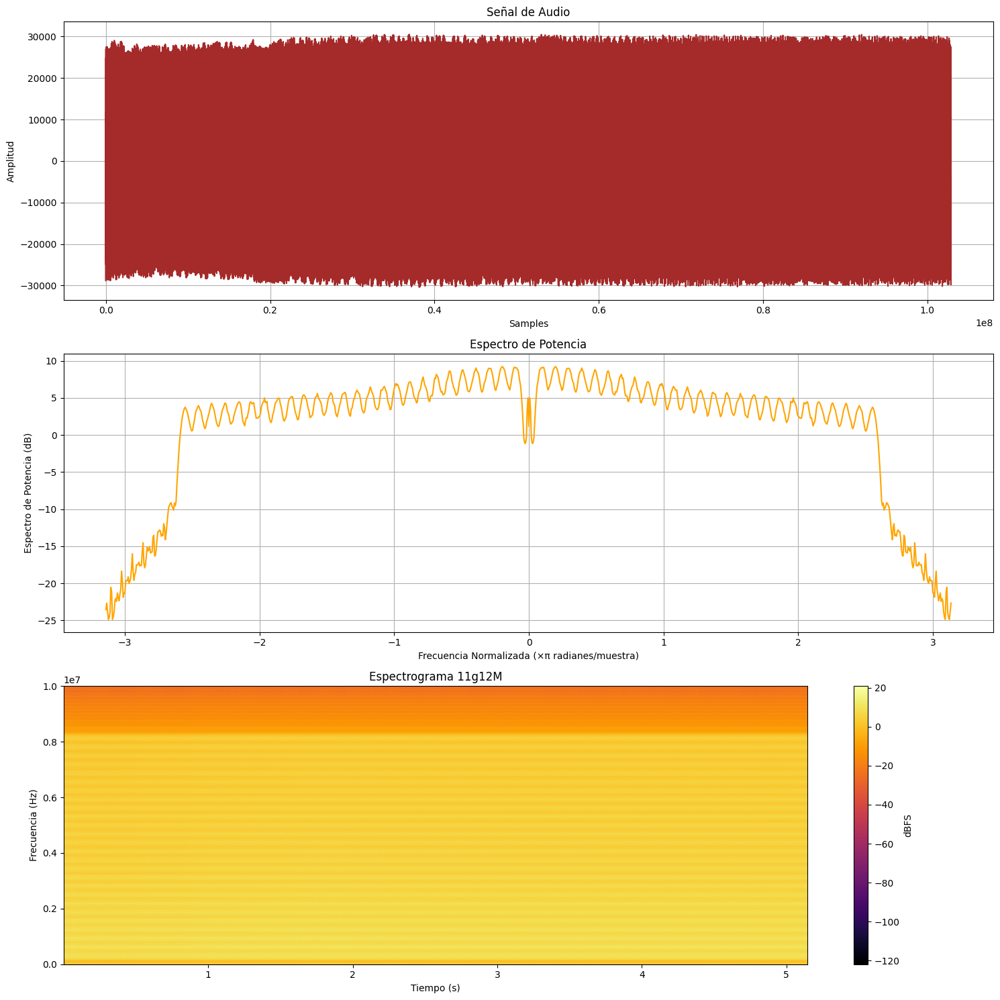

In [31]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g12M_2024-07-01T20_28_25_061.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g12M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-32-84b54eccf708>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


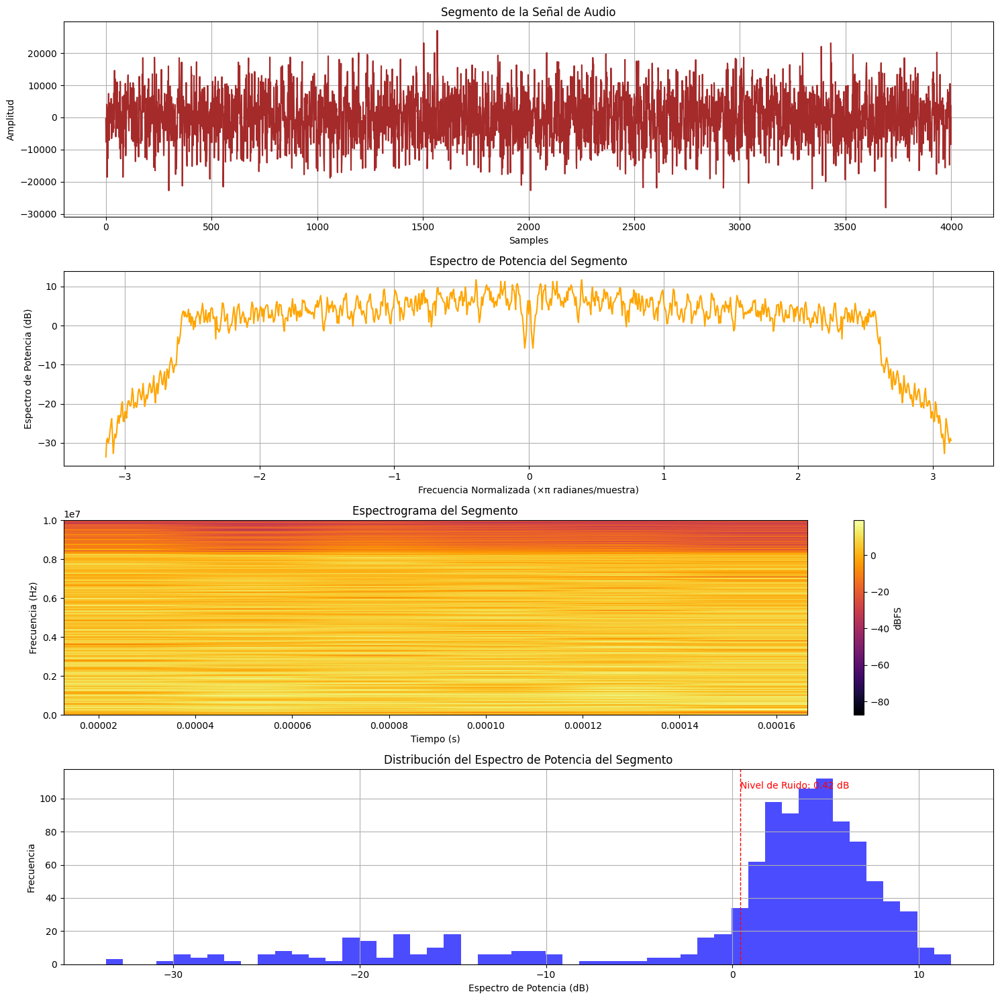

In [32]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g12M_2024-07-01T20_28_25_061.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-33-1ba6b03bab70>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


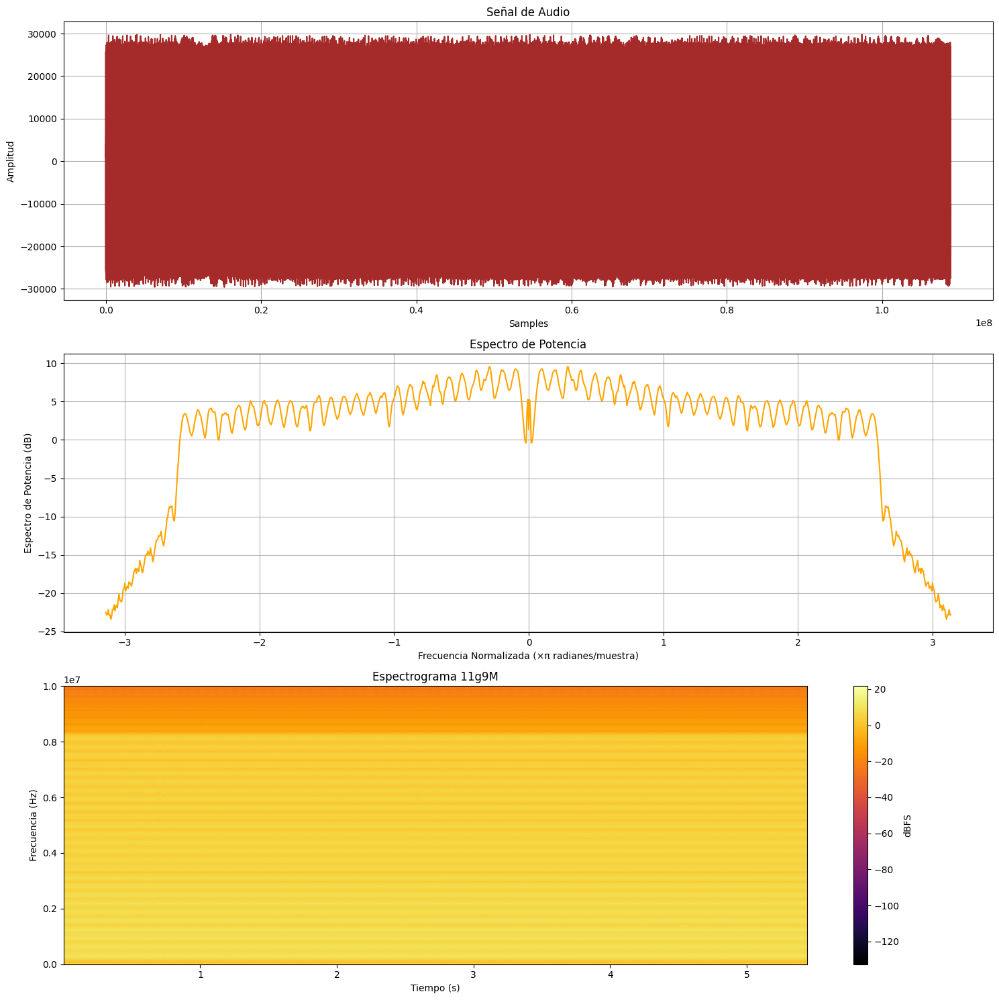

In [33]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g9M_2024-07-01T20_26_59_997.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g9M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-34-e303bdb8410e>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


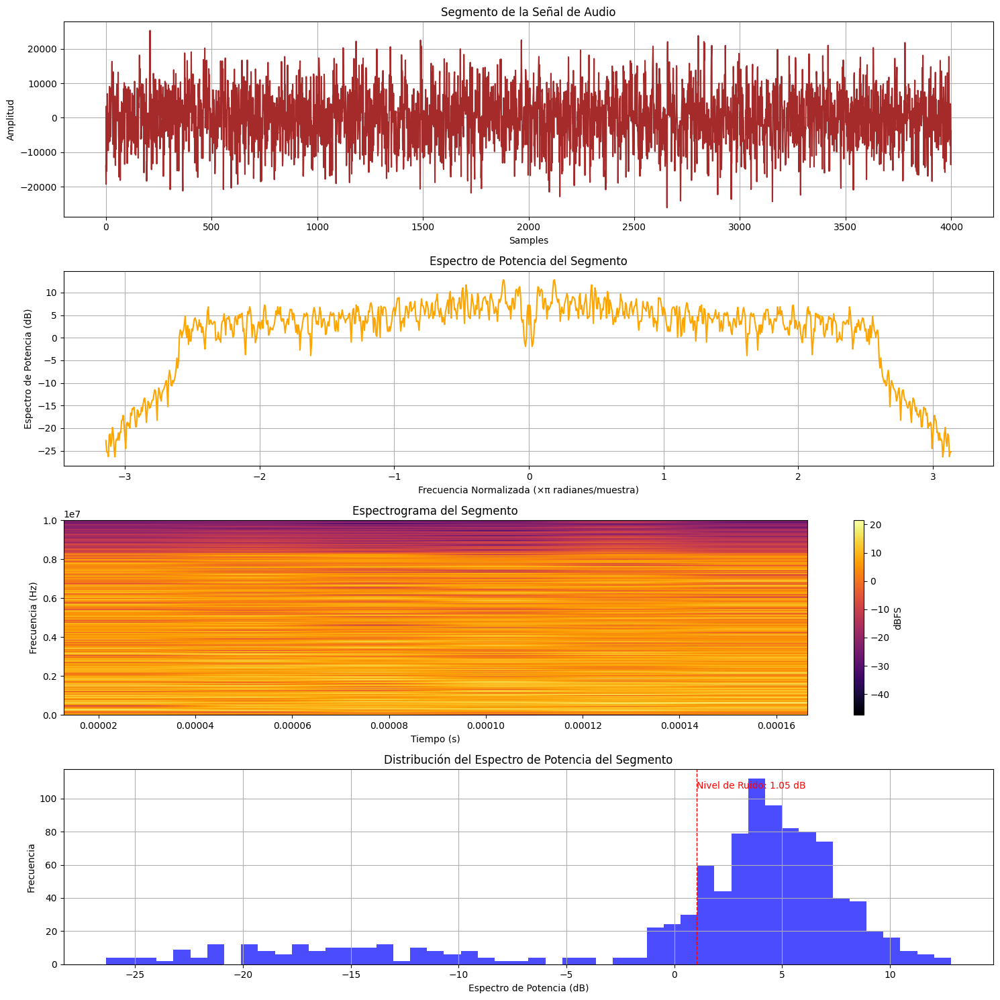

In [34]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g9M_2024-07-01T20_26_59_997.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-35-bca9afc2bf77>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


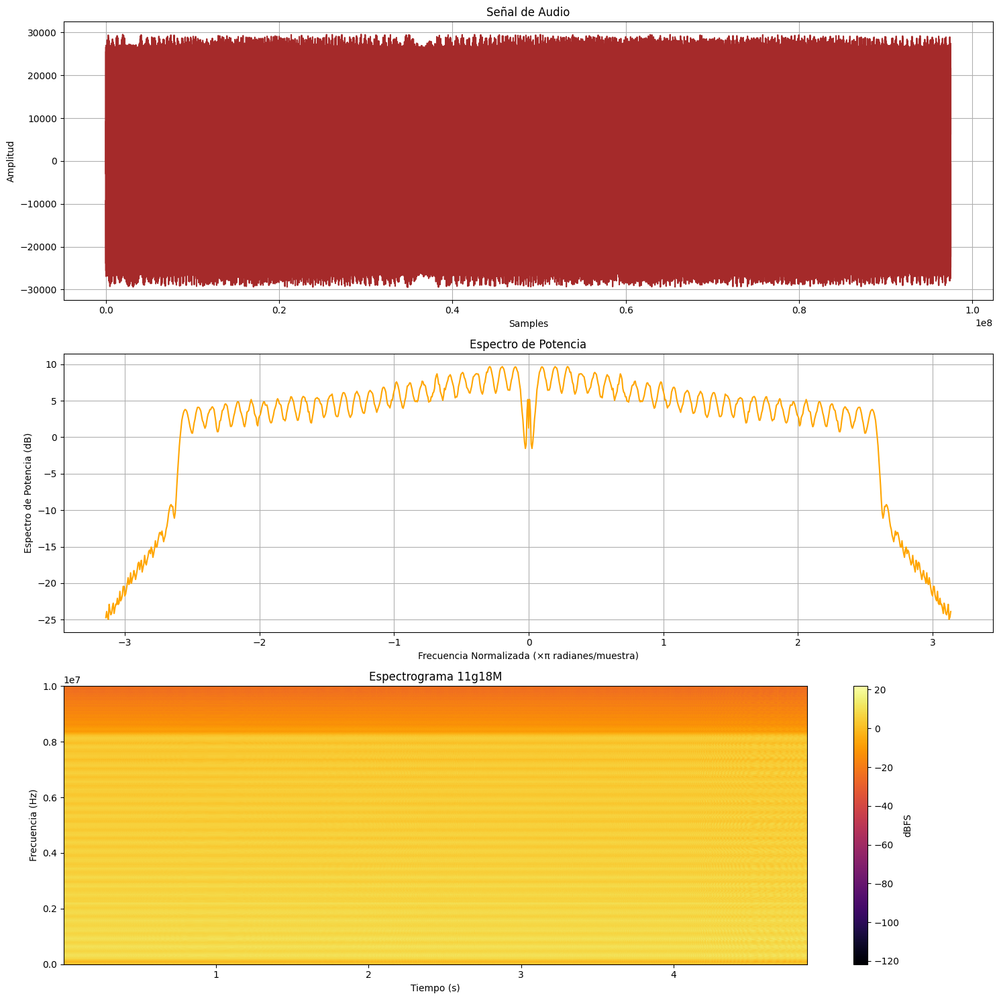

In [35]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g18M_2024-07-01T20_28_43_566.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g18M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-36-f22de768233c>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


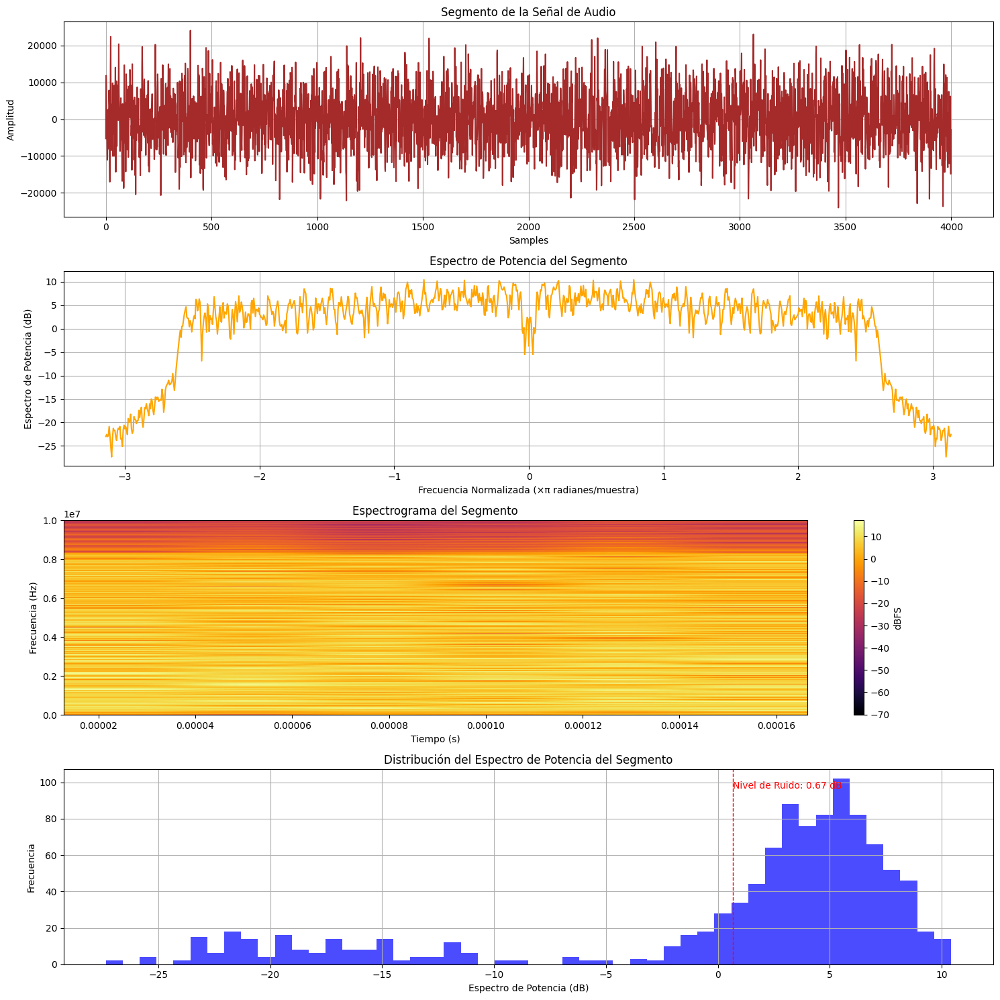

In [36]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g18M_2024-07-01T20_28_43_566.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-37-93ae8f39d301>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


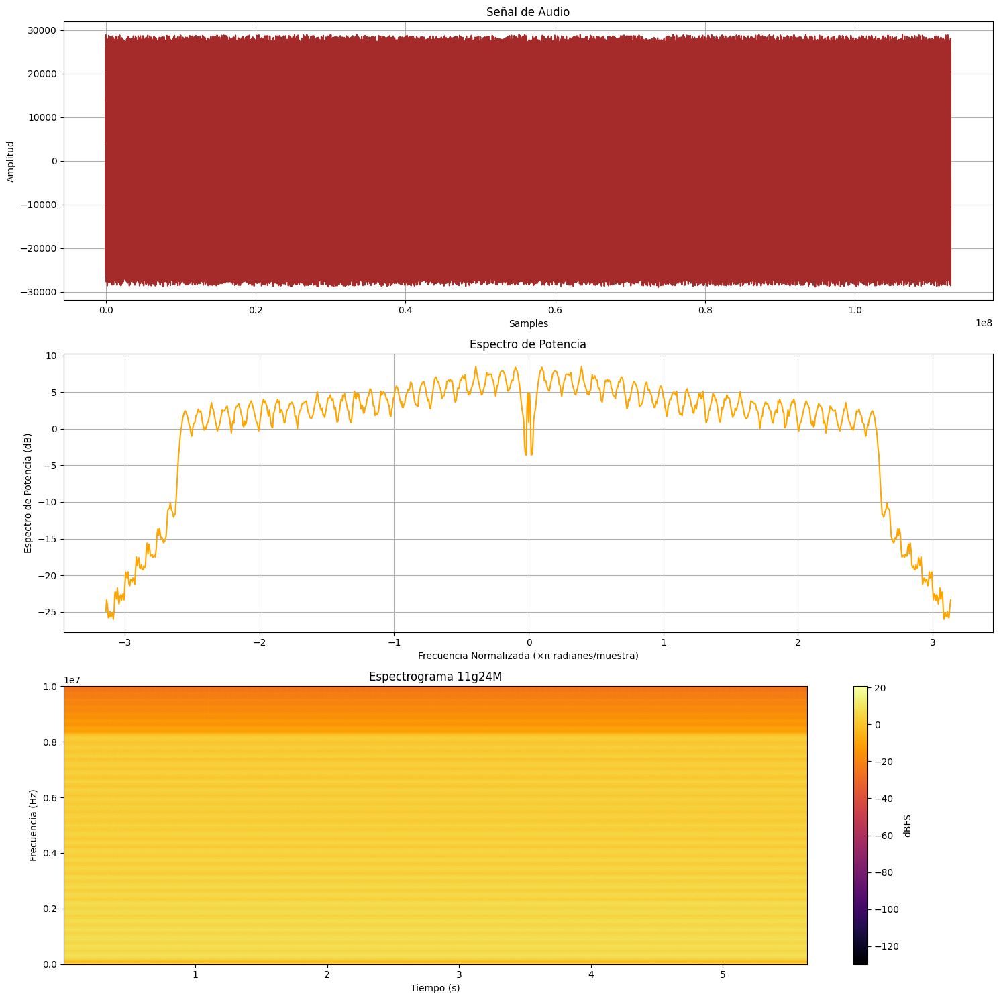

In [37]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g24M_2024-07-01T20_29_04_581.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g24M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-42-7b7ca412b782>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


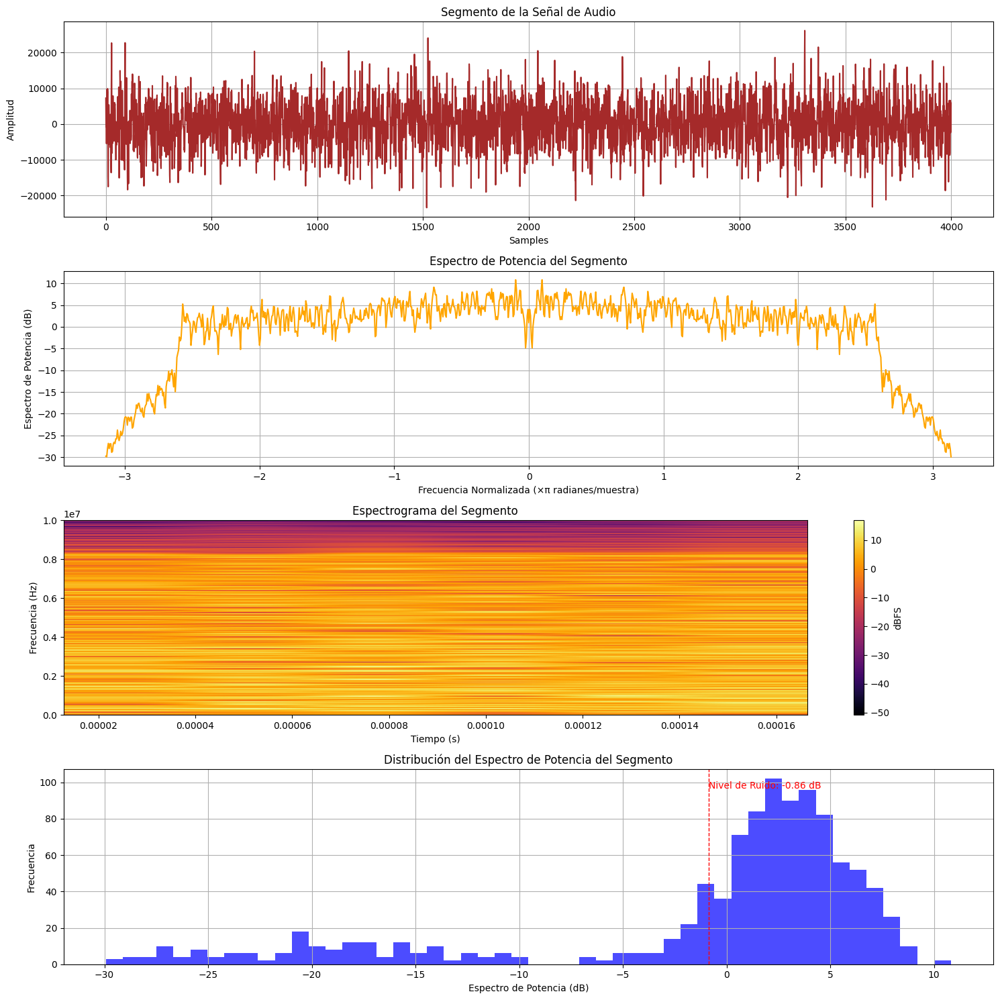

In [42]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g24M_2024-07-01T20_29_04_581.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-48-a316e63c0dcf>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


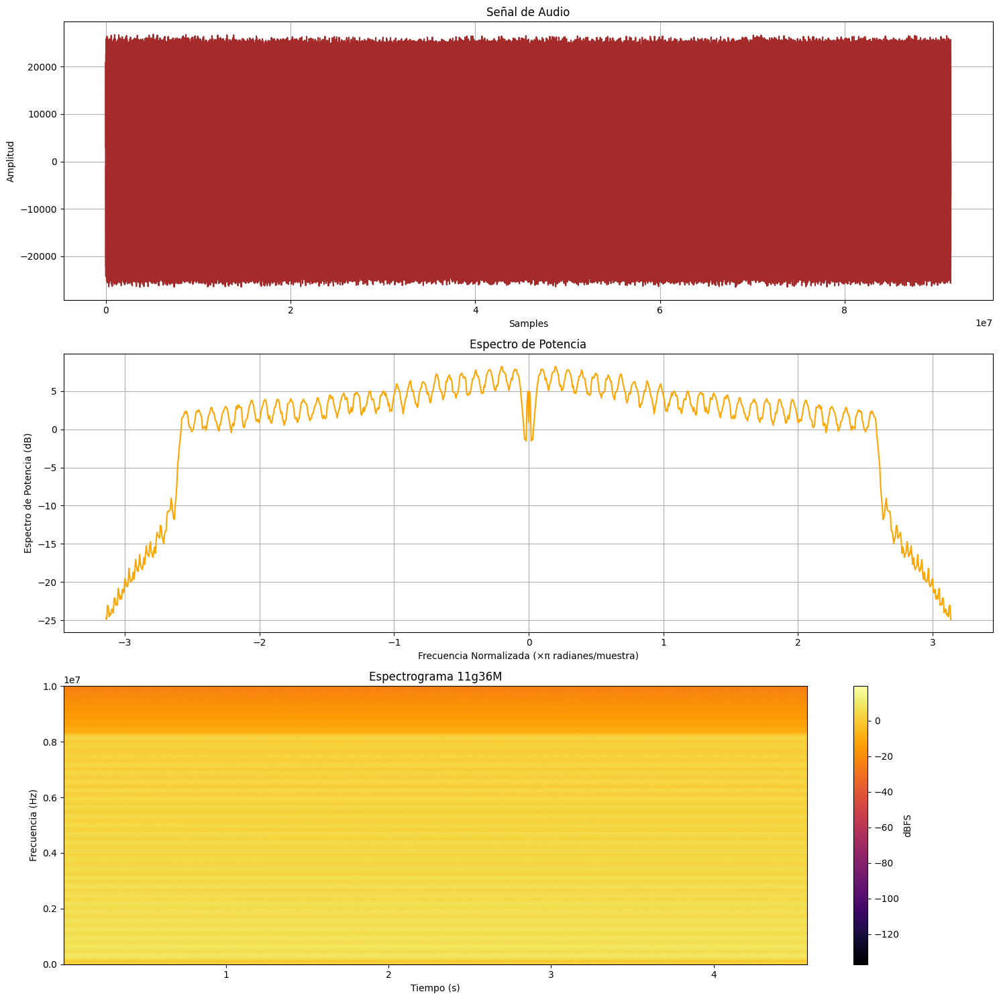

In [48]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g36M_2024-07-01T20_29_24_492.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g36M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-47-340c747454d5>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


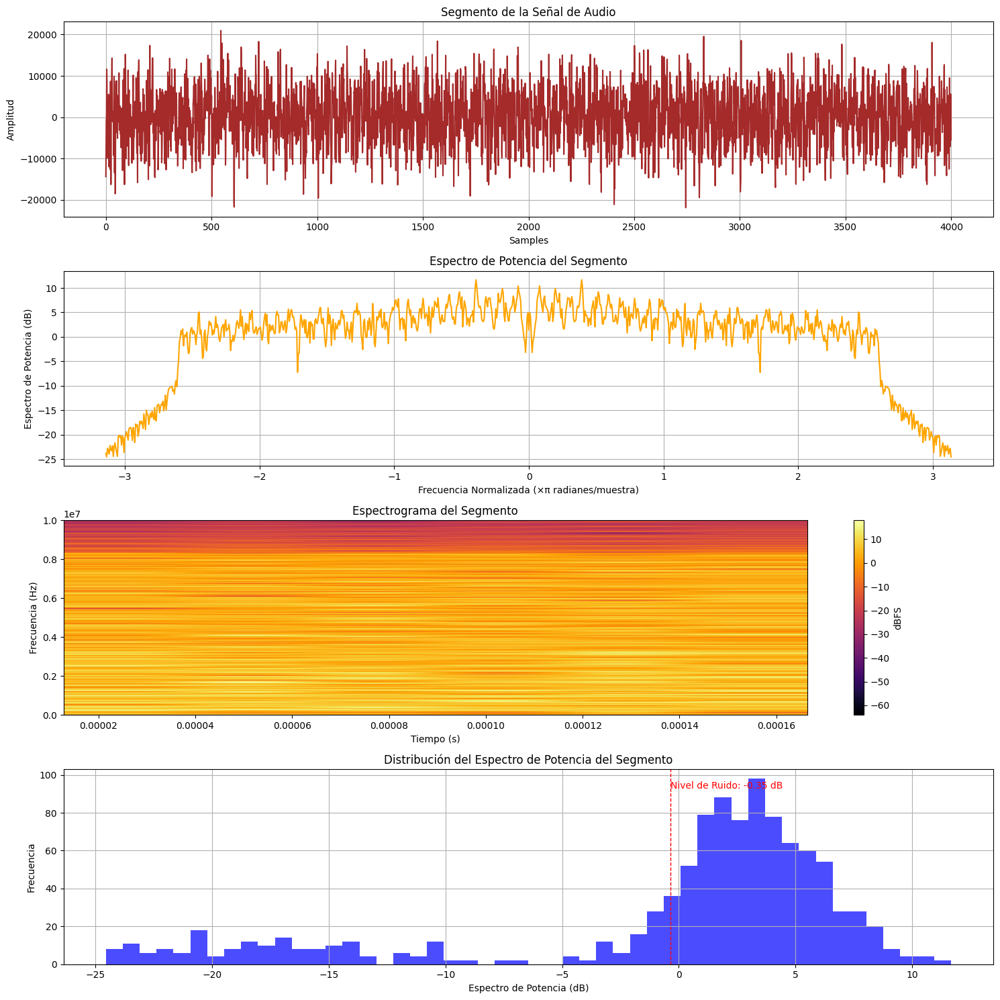

In [47]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g36M_2024-07-01T20_29_24_492.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-46-a4250a73d61d>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


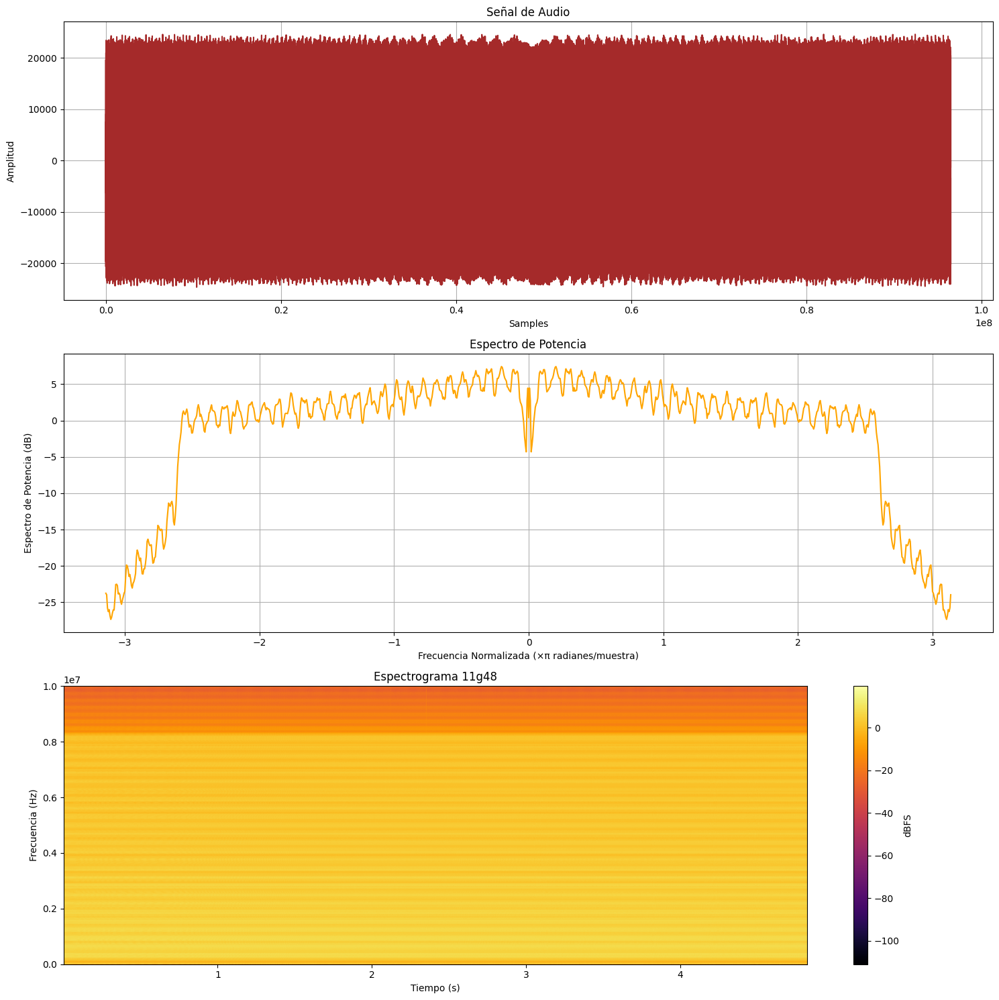

In [46]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g48M_2024-07-01T20_29_46_553.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g48')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-45-47d09d45a6c7>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


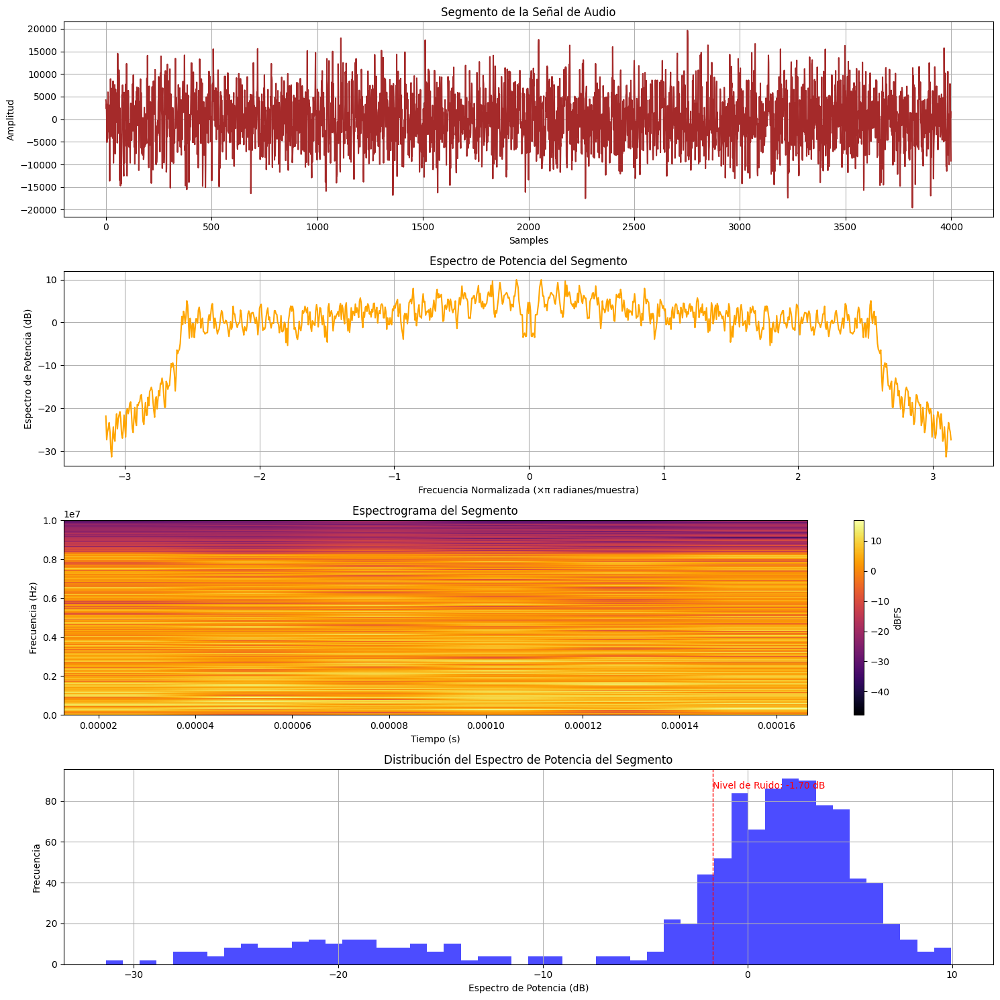

In [45]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g48M_2024-07-01T20_29_46_553.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-44-d930d624ddcc>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


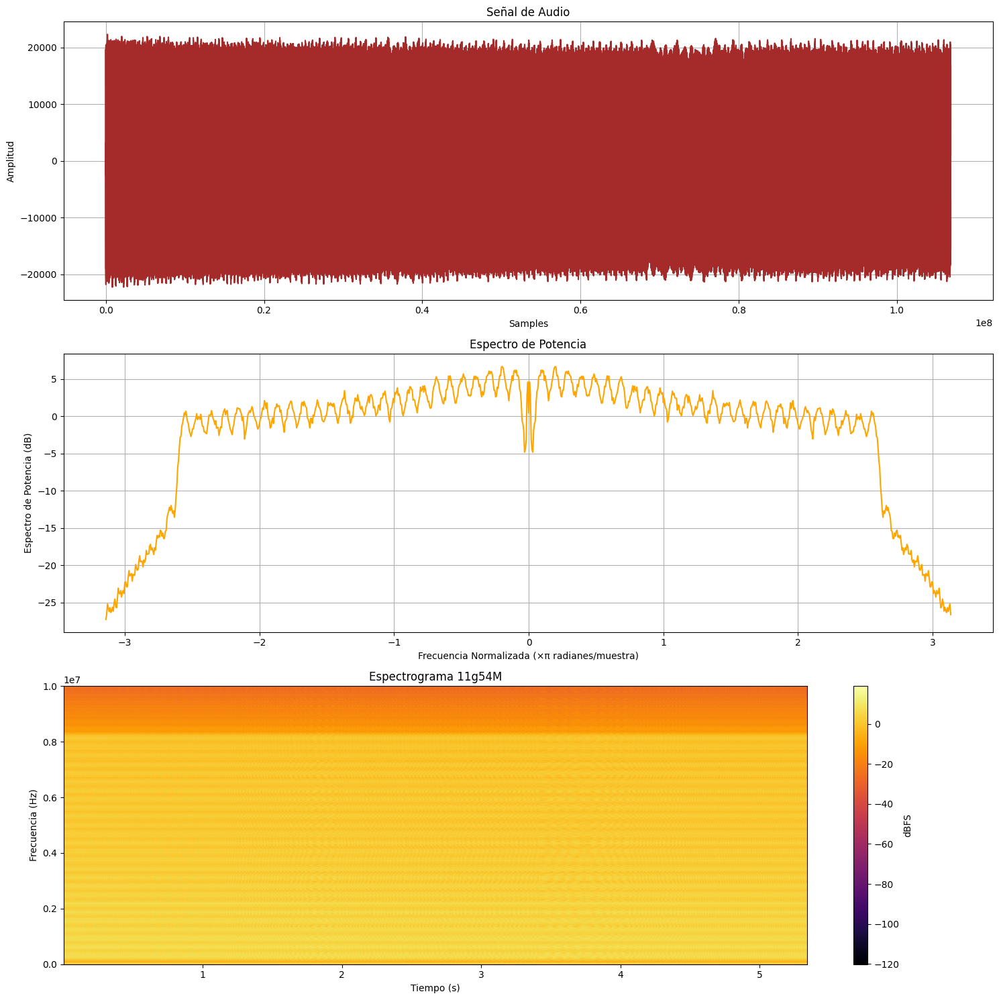

In [44]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g54M_2024-07-01T20_30_09_988.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g54M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-43-ef34290e5160>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


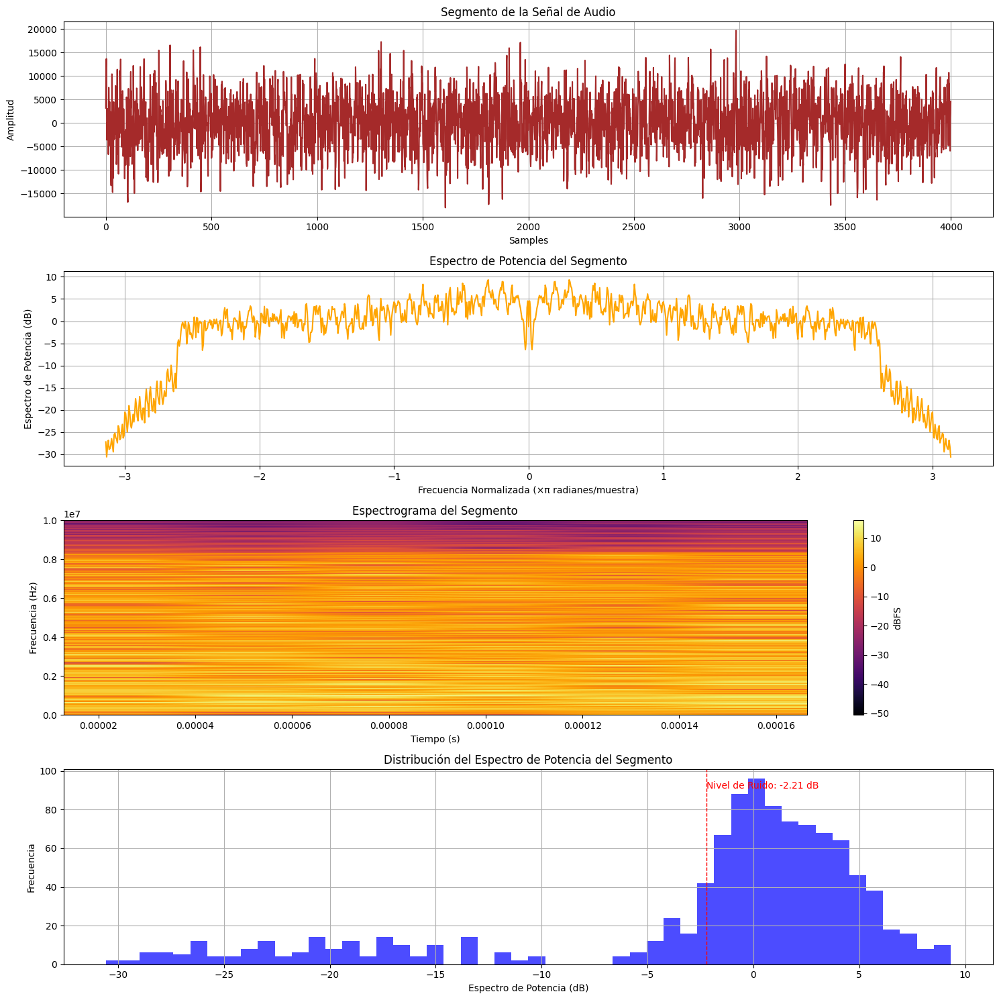

In [43]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo4SDR/11g54M_2024-07-01T20_30_09_988.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()